In [1]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.svm import SVR, LinearSVR
from sklearn.neighbors import KNeighborsRegressor
from sklearn.neural_network import MLPRegressor
from sklearn.metrics import r2_score, mean_squared_error
from scipy.stats import spearmanr, gaussian_kde
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from mpl_toolkits.axes_grid1 import make_axes_locatable
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Ridge
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
import numpy as np
import torch
from torch.nn.functional import normalize
import seaborn as sns
import pandas as pd
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve
from sklearn.metrics import auc
from sklearn.metrics import accuracy_score
from sklearn.metrics import f1_score

from multiprocessing import Pool, cpu_count

from tqdm import tqdm
import os

In [2]:
# Load data
# path_to_data = '../data-bloom/'
path_to_data = '../data-bloom-with-max-pooling/'

## Regroup all embeddings
# find all files beginning with embeddings
files = [f for f in os.listdir(path_to_data) if f.startswith('embeddings') if not "FLAWED" in f]
files.sort()
embeddings = []
for file in files:
    embeddings.append(torch.load(path_to_data + file).to(float))
embeddings_names = ["_".join(f.split('_')[2:]) for f in files]

## Sequence only embeddings and 6xf5 (to show structures are better)
sequence_only_embeddings = [embedding for ind, embedding in enumerate(embeddings) if 'sequence' in files[ind] or "Isolated" in files[ind]]
sequence_only_embeddings_names = [embeddings_names[ind] for ind, embedding in enumerate(embeddings) if 'sequence' in files[ind] or "Isolated" in files[ind]]
assert len(sequence_only_embeddings) == len(sequence_only_embeddings_names)

## Sequence + structure embeddings
sequence_structure_embeddings = [embedding for ind, embedding in enumerate(embeddings) if 'sequence' not in files[ind] and not "mutated" in files[ind] and not "md" in files[ind]]
sequence_structure_embeddings_names = [embeddings_names[ind] for ind, embedding in enumerate(embeddings) if 'sequence' not in files[ind] and not "mutated" in files[ind] and not "md" in files[ind]]
assert len(sequence_structure_embeddings) == len(sequence_structure_embeddings_names)

## Mutated embeddings (that are actually 6xf5) + WT_6xf5
mutated_embeddings = [f for f in os.listdir(path_to_data) if f.startswith('embeddings') if "6xf5" in f and not "FLAWED" in f]
mutated_embeddings.sort()
mutated_embeddings_names = ["_".join(f.split('_')[2:]) for f in mutated_embeddings]
mutated_embeddings = [torch.load(path_to_data + f) for f in mutated_embeddings] 

# Load kd
kd_ace = torch.load(path_to_data + 'logKd_ACE2.pt')

/tmp/ipykernel_116009/2450873505.py:11: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  embeddings.append(torch.load(path_to_data + file).to(float))
/tmp/ipykernel_116009/2450

In [3]:
sequence_only_embeddings_names

['esm1v_650m.pt', 'esm2_15b.pt', 'esm2_650m.pt', 'esm3.pt']

In [4]:
sequence_structure_embeddings_names

['max_pooling_7kmg_bloom.pt',
 'max_pooling_7soc_bloom.pt',
 'max_pooling_7w9i_bloom.pt',
 'withCoordinates_7kmg_bloom.pt',
 'withCoordinates_7soc_bloom.pt',
 'withCoordinates_7w9i_bloom.pt',
 'pooling_7kmg_bloom.pt',
 'pooling_7soc_bloom.pt',
 'pooling_7w9i_bloom.pt',
 '7kmg_bloom.pt',
 '7soc_bloom.pt',
 '7w9i_bloom.pt']

In [5]:
mutated_embeddings_names

['pooling_minim_gromacs_mutated_6xf5.pt', 'minim_gromacs_mutated_6xf5.pt']

In [6]:
def normalize_kd(kd):
    return (kd - kd.mean()) / kd.std()
def normalize_embeddings(embeddings):
    return (embeddings - embeddings.mean(dim=0)) / embeddings.std(dim=0)

embeddings_normalize = [normalize_embeddings(embedding) for embedding in embeddings]
mutated_embeddings_normalize = [normalize_embeddings(embedding) for embedding in mutated_embeddings]
sequence_only_embeddings_normalize = [normalize_embeddings(embedding) for embedding in sequence_only_embeddings]
sequence_structure_embeddings_normalize = [normalize_embeddings(embedding) for embedding in sequence_structure_embeddings]

In [7]:
print(mutated_embeddings_names)

['pooling_minim_gromacs_mutated_6xf5.pt', 'minim_gromacs_mutated_6xf5.pt']


# Train everything and save

In [11]:
def save_all_metrics(embeddings_list, KDs, model_class, embeddings_name, KDs_names, train_size=500, test_size=None, num_repeats=1, model_params={}, verbose=False, prefix=""):
    index = np.arange(len(embeddings_list[0]))
    # Select training and test data

    if num_repeats>1:
        seeds = np.arange(45, 45 + num_repeats)
    else:
        seeds = [np.random.randint(0, 1000)]
    results = []
    for ind_kd, kd_Y in enumerate(KDs):
        for ind, embeddings_X in enumerate(embeddings_list):
            for seed in tqdm(seeds, disable= not verbose):
                # Set seed for reproducibility
                np.random.seed(seed)

                index_train, index_test = train_test_split(index, test_size=test_size, train_size=train_size, random_state=seed)
                train_y = kd_Y[index_train]
                test_y = kd_Y[index_test]
                # Split the data into training and test sets
                train_X = embeddings_X[index_train]
                test_X = embeddings_X[index_test]

                # Set different random seeds for each repetition
                # seeds = np.arange(42, 42 + num_repeats)

                # Perform the benchmark
                model = model_class(**model_params)
                model.fit(train_X, train_y)
                predictions = model.predict(test_X)

                # Calculate R-squared (R2) score
                r2 = r2_score(test_y, predictions)
                # Calculate Spearman's correlation coefficient
                spearman, _ = spearmanr(predictions, test_y)
                # Calculate Mean Squared Error
                mse = mean_squared_error(test_y, predictions)

                mask_binding = np.array((test_y > 5))
                test_y_binding = mask_binding.astype(int)

                # Roc curve
                fpr, tpr, thresholds = roc_curve(test_y_binding, predictions)
                roc_auc = auc(fpr, tpr)

                pred_binding = np.array((predictions > 5)).astype(int)

                # Accuracy
                accuracy = accuracy_score(test_y_binding, pred_binding)

                # F1
                f1 = f1_score(test_y_binding, pred_binding)

                results.append({
                    "embedding": embeddings_name[ind],
                    "kd": KDs_names[ind_kd],
                    "r2": r2,
                    "spearman": spearman,
                    "mse": mse,
                    "seed": seed,
                    "roc_auc": roc_auc,
                    "accuracy": accuracy,
                    "f1": f1
                })

    results =  pd.DataFrame(results)
    
    results.to_csv(f'all-to-all-{model_class.__name__}-training-{train_X.shape[0]}.csv')

In [18]:
embeddings_names

['esm1v_650m.pt',
 'esm2_15b.pt',
 'esm2_650m.pt',
 'esm3_only_desai_old.pt',
 'one_hot.pt',
 '6xf5_1_minim_gromacs.pt',
 '6xf5_mutated_1_evoef_final_relax.pt',
 '6xf5_mutated_1_evoef_first_relax.pt',
 '6xf5_noisy_same_struct.pt',
 'ACE2_Delta_7w9i.pt',
 'ACE2_Delta_7w9i_first_relax.pt',
 'ACE2_omicron_7whh.pt',
 'CB6_WT_7xei.pt',
 'CB6_beta_7xeg.pt',
 'Cov555_WT_7kmg.pt',
 'Isolated_WT_down_state_6xf5.pt',
 'S309_Omicron_7xck.pt',
 'S309_Omicron_7xck_first_relax.pt',
 'S309_Omicron_7yad.pt',
 'S309_kappa_7soc.pt',
 'S309_kappa_7soc_final_relax.pt',
 'S309_kappa_7soc_first_relax.pt',
 'final_relax_rbd_mutated_WT_6xf5.pt',
 'first_relax_rbd_mutated_WT_6xf5.pt',
 'minim_gromacs_mutated_6xf5.pt',
 'no_relax_mutated_WT_6xf5.pt',
 'noisy_WT_6xf5.pt',
 'noisy_WT_6xf5_2.pt']

## Size 500

In [4]:
save_all_metrics(embeddings, KDs, LinearRegression, embeddings_names, kd_names, num_repeats=10, verbose=False, train_size=500)

/n/home13/tloux/.conda/envs/esm/lib/python3.11/site-packages/sklearn/metrics/_ranking.py:1174: UndefinedMetricWarning: No negative samples in y_true, false positive value should be meaningless
  warnings.warn(
/n/home13/tloux/.conda/envs/esm/lib/python3.11/site-packages/sklearn/metrics/_ranking.py:1174: UndefinedMetricWarning: No negative samples in y_true, false positive value should be meaningless
  warnings.warn(
/n/home13/tloux/.conda/envs/esm/lib/python3.11/site-packages/sklearn/metrics/_ranking.py:1174: UndefinedMetricWarning: No negative samples in y_true, false positive value should be meaningless
  warnings.warn(
/n/home13/tloux/.conda/envs/esm/lib/python3.11/site-packages/sklearn/metrics/_ranking.py:1174: UndefinedMetricWarning: No negative samples in y_true, false positive value should be meaningless
  warnings.warn(
/n/home13/tloux/.conda/envs/esm/lib/python3.11/site-packages/sklearn/metrics/_ranking.py:1174: UndefinedMetricWarning: No negative samples in y_true, false posi

In [ ]:
save_all_metrics(embeddings, KDs, RandomForestRegressor, embeddings_names, kd_names, model_params={"n_estimators":50, "n_jobs":-1}, num_repeats=10, verbose=False, train_size=500)

KeyboardInterrupt: 

In [5]:
save_all_metrics(embeddings, KDs, MLPRegressor, embeddings_names, kd_names, model_params={"hidden_layer_sizes":(100, 50), "max_iter":1000}, num_repeats=20, verbose=False, train_size=500)

/n/home13/tloux/.conda/envs/esm/lib/python3.11/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


## Size 5000

In [12]:
save_all_metrics(embeddings, KDs, LinearRegression, embeddings_names, kd_names, num_repeats=10, verbose=False, train_size=5000)

/n/home13/tloux/.conda/envs/esm/lib/python3.11/site-packages/sklearn/metrics/_ranking.py:1174: UndefinedMetricWarning: No negative samples in y_true, false positive value should be meaningless
  warnings.warn(
/n/home13/tloux/.conda/envs/esm/lib/python3.11/site-packages/sklearn/metrics/_ranking.py:1174: UndefinedMetricWarning: No negative samples in y_true, false positive value should be meaningless
  warnings.warn(
/n/home13/tloux/.conda/envs/esm/lib/python3.11/site-packages/sklearn/metrics/_ranking.py:1174: UndefinedMetricWarning: No negative samples in y_true, false positive value should be meaningless
  warnings.warn(
/n/home13/tloux/.conda/envs/esm/lib/python3.11/site-packages/sklearn/metrics/_ranking.py:1174: UndefinedMetricWarning: No negative samples in y_true, false positive value should be meaningless
  warnings.warn(
/n/home13/tloux/.conda/envs/esm/lib/python3.11/site-packages/sklearn/metrics/_ranking.py:1174: UndefinedMetricWarning: No negative samples in y_true, false posi

In [ ]:
save_all_metrics(embeddings, KDs, RandomForestRegressor, embeddings_names, kd_names, model_params={"n_estimators":50, "n_jobs":-1}, num_repeats=10, verbose=False, train_size=5000)

In [13]:
save_all_metrics(embeddings, KDs, MLPRegressor, embeddings_names, kd_names, model_params={"hidden_layer_sizes":(100, 50), "max_iter":1000}, num_repeats=10, verbose=False, train_size=5000)

# Resample dataset - test Output Head

In [14]:
# Function to perform the benchmark
def benchmark_models_with_resampling(embeddings_X, kd_Y, seeds, train_size=0.20, test_size=0.20):
    # Define a list of models to benchmark
    models = [
        ("RandomForest", RandomForestRegressor, {"n_estimators":50, "n_jobs":-1}),
        ("SVM", SVR, {}),
        ("k-NN", KNeighborsRegressor, {"n_neighbors":5}),
        ("MLP", MLPRegressor, {"hidden_layer_sizes":(100, 50), "max_iter":1000}),
        ("LR", LinearRegression, {})
    ]
    

    results = []

    for seed in tqdm(seeds):
        # Set seed for reproducibility
        np.random.seed(seed)
        torch.manual_seed(seed)

        model_results = {"seed": seed}
        train_X, test_X, train_y, test_y = train_test_split(embeddings_X, kd_Y, test_size=test_size, train_size=train_size, random_state=seed)

        for model_name, model_class, model_params in models:
            # Train the model
            model = model_class(**model_params)

            model.fit(train_X, train_y)

            # Make predictions on the test data
            predictions = model.predict(test_X)

            # Calculate R-squared (R2) score
            r2 = r2_score(test_y, predictions)

            # Calculate Spearman's correlation coefficient
            spearman, _ = spearmanr(predictions, test_y)

            # Calculate Mean Squared Error
            mse = mean_squared_error(test_y, predictions)

            model_results[model_name + '_r2'] = r2
            model_results[model_name + '_spearman'] = spearman
            model_results[model_name + '_mse'] = mse

        results.append(model_results)

    return results

def evaluate_output_head(embeddings_X, kd_Y, train_size=0.20, test_size=0.20, num_repeats=1):
    # Set different random seeds for each repetition
    seeds = np.arange(42, 42 + num_repeats)

    # Perform the benchmark
    results = benchmark_models_with_resampling(embeddings_X, kd_Y, seeds, train_size=train_size, test_size=test_size)

    # Plot and compare the results
    plt.figure(figsize=(10, 6))
    plt.tight_layout()
    plt.grid(True, which="both", linestyle="--", linewidth=0.5)
    for model_name in ["RandomForest","SVM", "k-NN", "MLP", "LR"]:
    #for model_name in ["RandomForest", "SVM", "k-NN", "LR"]:
        spearman_correlations = [result[model_name + '_spearman'] for result in results]
        #plot average and std
        plt.errorbar(np.mean(spearman_correlations), model_name, xerr=np.std(spearman_correlations), fmt='o', alpha=0.6)
        plt.scatter(np.mean(spearman_correlations), model_name, alpha=0.6)
    plt.xlabel('Spearman Correlation Coefficient')
    plt.ylabel('Model')
    plt.title('Old to New Desai, train size: '+str(train_size)+', test size: '+str(test_size))
    plt.legend(["RandomForest", "SVM", "k-NN", "MLP", "LR"])
    #plt.legend(["RandomForest", "SVM", "k-NN", "LR"])
    plt.show()


In [15]:
mutated_embeddings_names

['pooling_minim_gromacs_mutated_6xf5.pt', 'minim_gromacs_mutated_6xf5.pt']

In [9]:
kd_cov555_normalize = (kd_cov555 - kd_cov555.mean()) / kd_cov555.std()

## For a mutated embeddings (minim_gromacs)

In [16]:
embeddings_names

['max_pooling_7kmg_bloom.pt',
 'max_pooling_7soc_bloom.pt',
 'max_pooling_7w9i_bloom.pt',
 'withCoordinates_7kmg_bloom.pt',
 'withCoordinates_7soc_bloom.pt',
 'withCoordinates_7w9i_bloom.pt',
 'pooling_7kmg_bloom.pt',
 'pooling_7soc_bloom.pt',
 'pooling_7w9i_bloom.pt',
 'pooling_minim_gromacs_mutated_6xf5.pt',
 'esm1v_650m.pt',
 'esm2_15b.pt',
 'esm2_650m.pt',
 'esm3.pt',
 '7kmg_bloom.pt',
 '7soc_bloom.pt',
 '7w9i_bloom.pt',
 'minim_gromacs_mutated_6xf5.pt']

In [17]:
index = np.where(np.array(embeddings_names) == 'max_pooling_7kmg_bloom.pt')[0][0]

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.93s/it]


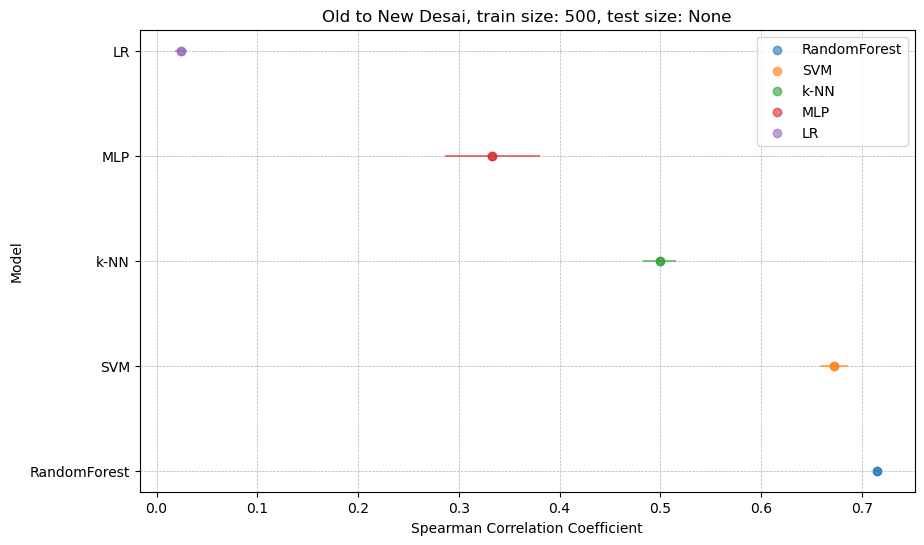

In [18]:
evaluate_output_head(embeddings_normalize[index], kd_ace, num_repeats=3, train_size=500, test_size=None)

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:25<00:00,  8.63s/it]


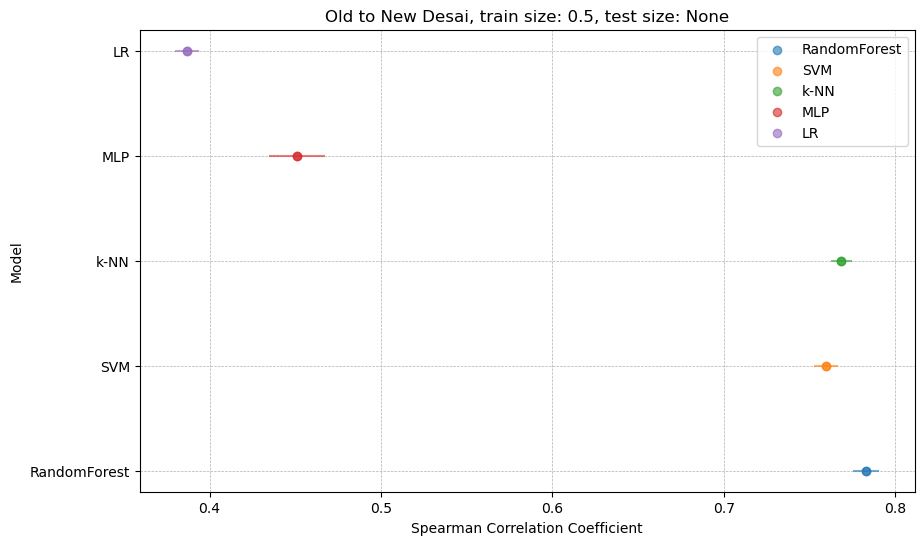

In [19]:
evaluate_output_head(embeddings_normalize[index], kd_ace, num_repeats=3, train_size=0.5, test_size=None)

In [6]:
minim_embeddings_normalize = (mutated_embeddings[index] - mutated_embeddings[index].mean(dim=0))/mutated_embeddings[index].std(dim=0)

In [21]:
embeddings_names

['esm1v_650m.pt',
 'esm2_15b.pt',
 'esm2_650m.pt',
 'esm3.pt',
 'ACE2_Delta_7w9i.pt',
 'ACE2_omicron_7whh.pt',
 'CB6_WT_7xei.pt',
 'CB6_beta_7xeg.pt',
 'Cov555_WT_7kmg.pt',
 'Isolated_WT_down_state_6xf5.pt',
 'S309_Omicron_7xck.pt',
 'S309_Omicron_7yad.pt',
 'S309_kappa_7soc.pt']

In [7]:
index_to_test = 1
embeddings[index_to_test][0].mean(dim=0), embeddings[index_to_test][0].std(dim=0) 

(tensor(0.0018), tensor(0.1430))

## For a structure simple

In [17]:
sequence_structure_embeddings_names

['withCoordinates_7kmg_bloom.pt',
 'withCoordinates_7kmg_entire_complex.pt',
 'withCoordinates_7soc_bloom.pt',
 'withCoordinates_7w9i_bloom.pt',
 'withCoordinates_7whh_bloom.pt',
 'withCoordinates_7xck_bloom.pt',
 'withCoordinates_7xeg_bloom.pt',
 'ACE2_Delta_7w9i.pt',
 'ACE2_omicron_7whh.pt',
 'CB6_WT_7xei.pt',
 'CB6_beta_7xeg.pt',
 'Cov555_WT_7kmg.pt',
 'Isolated_WT_down_state_6xf5.pt',
 'S309_Omicron_7xck.pt',
 'S309_Omicron_7yad.pt',
 'S309_kappa_7soc.pt']

In [26]:
sequence_structure_embeddings[8].shape

torch.Size([32768, 1536])

In [18]:
index = np.where([name == 'withCoordinates_7kmg_bloom.pt' for name in sequence_structure_embeddings_names])[0][0]

  0%|                                                                                                                                   | 0/3 [00:00<?, ?it/s]

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:09<00:00,  3.11s/it]


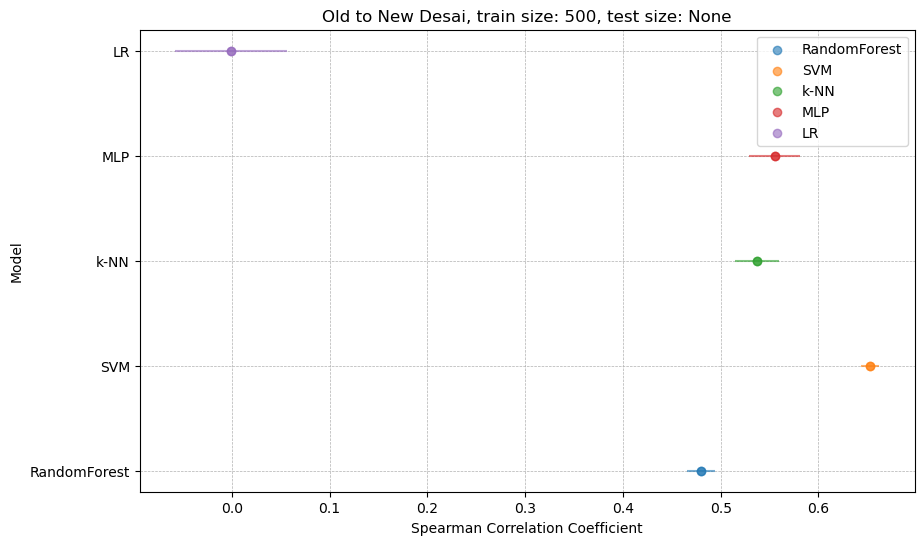

In [21]:
evaluate_output_head(sequence_structure_embeddings_normalize[index], normalize_kd(kd_ace), num_repeats=3, train_size=500, test_size=None)

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:38<00:00, 12.96s/it]


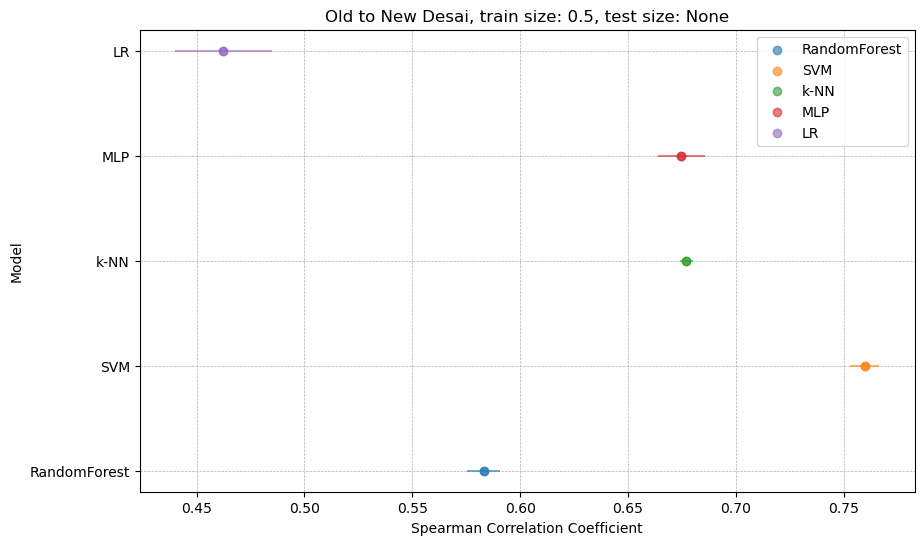

In [22]:
evaluate_output_head(sequence_structure_embeddings_normalize[index], normalize_kd(kd_ace), num_repeats=3, train_size=0.5, test_size=None)

# Show all metrics to compare embeddings (Regression) (COV555 and S309)

In [8]:
def evaluate_embeddings_all_metrics_regression(embeddings_list, kd_Y, model_class, embeddings_name, kd_name, train_size=500, test_size=500, num_repeats=1, model_params={}, verbose=False, prefix="", renormalize=False):
    index = np.arange(len(embeddings_list[0]))
    # Select training and test data

    if renormalize:
        kd_scaler = StandardScaler()
        kd_Y = kd_scaler.fit_transform(kd_Y.reshape(-1, 1)).reshape(-1)

    if num_repeats>1:
        seeds = np.arange(45, 45 + num_repeats)
    else:
        seeds = [np.random.randint(0, 1000)]
    results = []
    for ind, embeddings_X in enumerate(embeddings_list):
        for seed in tqdm(seeds, disable= not verbose):
            # Set seed for reproducibility
            np.random.seed(seed)

            index_train, index_test = train_test_split(index, test_size=test_size, train_size=train_size, random_state=seed)
            train_y = kd_Y[index_train]
            test_y = kd_Y[index_test]
            # Split the data into training and test sets
            train_X = embeddings_X[index_train]
            test_X = embeddings_X[index_test]

            # Set different random seeds for each repetition
            # seeds = np.arange(42, 42 + num_repeats)

            # Perform the benchmark
            model = model_class(**model_params)
            model.fit(train_X, train_y)
            predictions = model.predict(test_X)

            if renormalize:
                predictions = kd_scaler.inverse_transform(predictions.reshape(-1, 1)).reshape(-1)

            # Calculate R-squared (R2) score
            r2 = r2_score(test_y, predictions)
            # Calculate Spearman's correlation coefficient
            spearman, _ = spearmanr(predictions, test_y)
            # Calculate Mean Squared Error
            mse = mean_squared_error(test_y, predictions)

            results.append({"embedding": embeddings_name[ind], "r2": r2, "spearman": spearman, "mse": mse, "seed": seed})

    metrics = ['r2', 'spearman', 'mse']
    colours = ['b', 'g', 'r']

    # Create a figure and an array of subplots with one row per metric
    fig, axs = plt.subplots(1, len(metrics), figsize=(4*len(metrics), 7))
    fig.tight_layout(pad=5.0)

    results =  pd.DataFrame(results)
    
    # Plot each metric in a separate subplot
    for ax, colour, metric in zip(axs, colours, metrics):
        sns.boxplot(x=metric, y="embedding", hue='embedding', data=results, ax=ax, orient='h', palette='Set2', vert=False)
        # ax.set_xlabel('Spearman Correlation Coefficient')
        ax.set_title(f'{metric.capitalize()} Metric')
        ax.grid(True, which="both", linestyle="--", linewidth=0.5)
        ax.set_ylabel('')

        # Remove y-tick labels for all but the first subplot
        if ax != axs[0]:
            ax.set_yticklabels([])

    # Add a legend at the bottom for all metrics
    # legend_elements = [mpatches.Patch(color=colour, label=metric.capitalize()) for colour, metric in zip(colours, metrics)]
    # fig.legend(handles=legend_elements)
    plt.suptitle(f'Training on old Desai with {model_class.__name__} for {kd_name} binding affinity, train size: {train_X.shape[0]}, test size: {test_X.shape[0]}')
    fig.savefig(f'{prefix}{kd_name}_{model_class.__name__}_train_size_{train_X.shape[0]}_regression.png', bbox_inches='tight')
    plt.show()

In [9]:
def evaluate(seed, embeddings_X, embedding_name, kd_Y, model_class, model_params, train_size, test_size, scaler=None):
    # Set seed for reproducibility
    index = np.arange(len(embeddings_X))
    np.random.seed(seed)

    index_train, index_test = train_test_split(index, test_size=test_size, train_size=train_size, random_state=seed)
    train_y = kd_Y[index_train]
    test_y = kd_Y[index_test]
    # Split the data into training and test sets
    train_X = embeddings_X[index_train]
    test_X = embeddings_X[index_test]

    # Set different random seeds for each repetition
    # seeds = np.arange(42, 42 + num_repeats)

    # Perform the benchmark
    model = model_class(**model_params)
    model.fit(train_X, train_y)
    predictions = model.predict(test_X)

    if scaler is not None:
        predictions = scaler.inverse_transform(predictions.reshape(-1, 1)).reshape(-1)
        test_y = scaler.inverse_transform(test_y.reshape(-1, 1)).reshape(-1)

    r2 = r2_score(test_y, predictions)
    spearman, _ = spearmanr(predictions, test_y)
    mse = mean_squared_error(test_y, predictions)
    return {"embedding": embedding_name, "r2": r2, "spearman": spearman, "mse": mse, "seed": seed}
    

def evaluate_embeddings_all_metrics_regression_multiprocessing(embeddings_list, kd_Y, model_class, embeddings_name, kd_name, train_size=500, test_size=500, num_repeats=1, model_params={}, verbose=False, prefix="", renormalize=False):
    index = np.arange(len(embeddings_list[0]))
    # Select training and test data

    if renormalize:
        kd_scaler = StandardScaler()
        kd_Y = kd_scaler.fit_transform(kd_Y.reshape(-1, 1)).reshape(-1)

    if num_repeats>1:
        seeds = np.arange(45, 45 + num_repeats)
    else:
        seeds = [np.random.randint(0, 1000)]

    with Pool(cpu_count()) as p:
        results = p.starmap(evaluate, tqdm([(seed, embeddings_X, embeddings_name[ind], kd_Y, model_class, model_params, train_size, test_size, kd_scaler if renormalize else None) for ind, embeddings_X in enumerate(embeddings_list) for seed in seeds], total=len(embeddings_list)*len(seeds)))

    metrics = ['r2', 'spearman', 'mse']
    colours = ['b', 'g', 'r']

    # Create a figure and an array of subplots with one row per metric
    fig, axs = plt.subplots(1, len(metrics), figsize=(4*len(metrics), 7))
    fig.tight_layout(pad=5.0)

    results =  pd.DataFrame(results)
    
    # Plot each metric in a separate subplot
    for ax, colour, metric in zip(axs, colours, metrics):
        sns.boxplot(x=metric, y="embedding", hue='embedding', data=results, ax=ax, orient='h', palette='Set2', vert=False)
        # ax.set_xlabel('Spearman Correlation Coefficient')
        ax.set_title(f'{metric.capitalize()} Metric')
        ax.grid(True, which="both", linestyle="--", linewidth=0.5)
        ax.set_ylabel('')

        # Remove y-tick labels for all but the first subplot
        if ax != axs[0]:
            ax.set_yticklabels([])

    # Add a legend at the bottom for all metrics
    # legend_elements = [mpatches.Patch(color=colour, label=metric.capitalize()) for colour, metric in zip(colours, metrics)]
    # fig.legend(handles=legend_elements)
    plt.suptitle(f'Training on old Desai with {model_class.__name__} for {kd_name} binding affinity, train size: {train_size}, test size: {test_size}')
    fig.savefig(f'{prefix}{kd_name}_{model_class.__name__}_train_size_{train_size}_regression.png', bbox_inches='tight')
    plt.show()

### On all

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 360/360 [00:05<00:00, 63.07it/s]


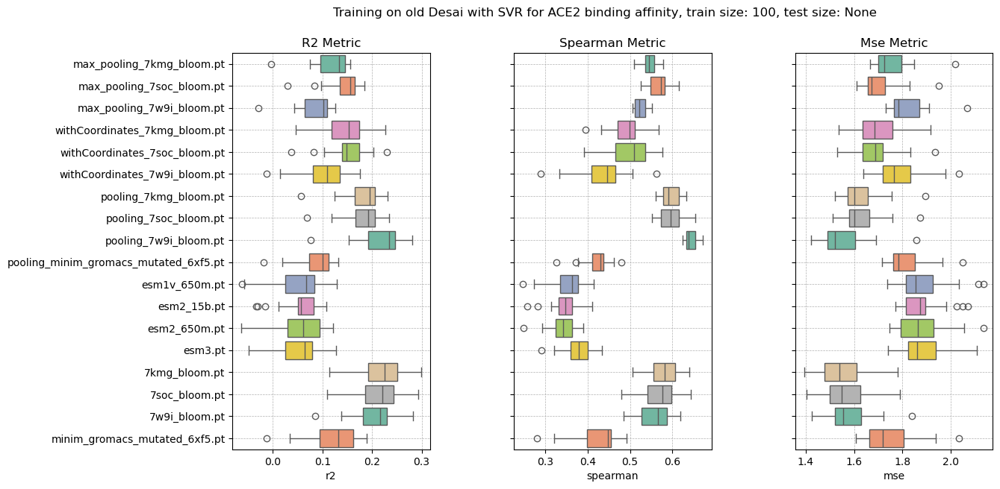

In [10]:
evaluate_embeddings_all_metrics_regression_multiprocessing(embeddings_normalize, kd_ace, SVR, embeddings_names, "ACE2", num_repeats=20, train_size=100, test_size=None, model_params={}, prefix="all_", renormalize=True)

  0%|                                                                                                                             | 0/360 [00:00<?, ?it/s]

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 360/360 [00:16<00:00, 21.91it/s]


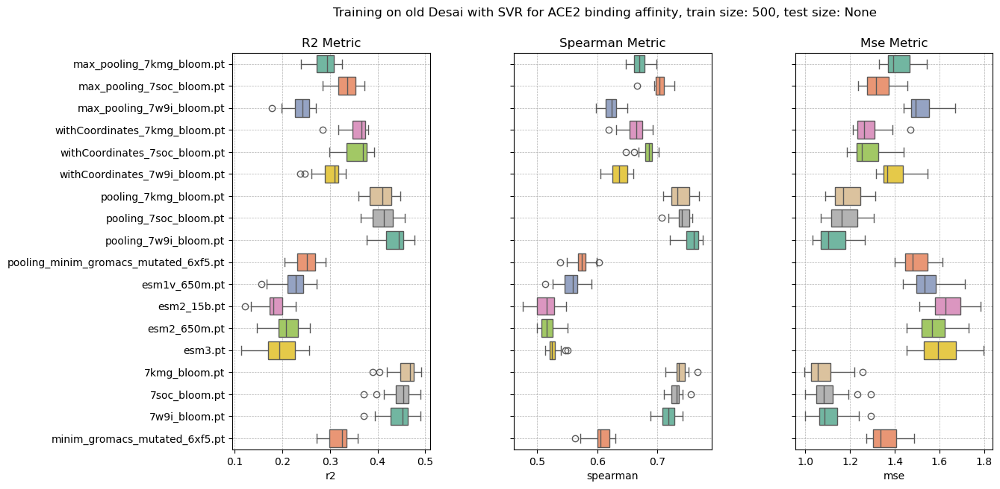

In [11]:
evaluate_embeddings_all_metrics_regression_multiprocessing(embeddings_normalize, kd_ace, SVR, embeddings_names, "ACE2", num_repeats=20, train_size=500, test_size=None, model_params={}, prefix="all_", renormalize=True)

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 360/360 [01:34<00:00,  3.82it/s]


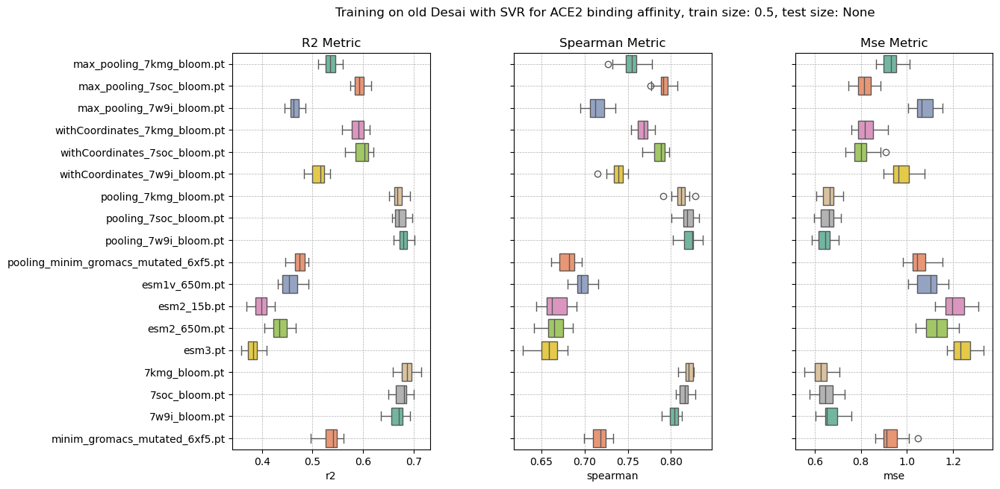

In [12]:
evaluate_embeddings_all_metrics_regression_multiprocessing(embeddings_normalize, kd_ace, SVR, embeddings_names, "ACE2", num_repeats=20, train_size=0.5, test_size=None, model_params={}, prefix="all_", renormalize=True)

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 360/360 [02:30<00:00,  2.39it/s]


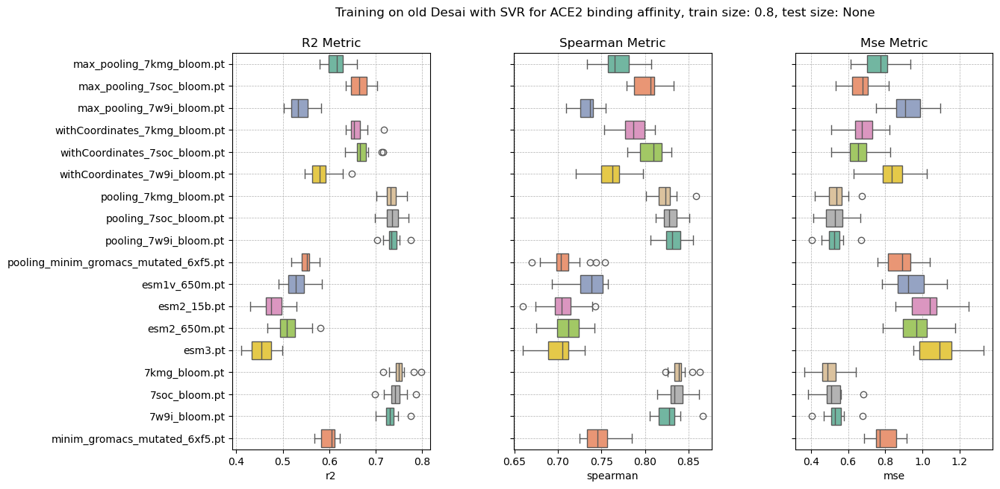

In [13]:
evaluate_embeddings_all_metrics_regression_multiprocessing(embeddings_normalize, kd_ace, SVR, embeddings_names, "ACE2", num_repeats=20, train_size=0.8, test_size=None, model_params={}, prefix="all_", renormalize=True)

### On all - sequence only

100%|████████████████████████████████████████████████████████████████████████████████████████| 120/120 [00:05<00:00, 20.64it/s]


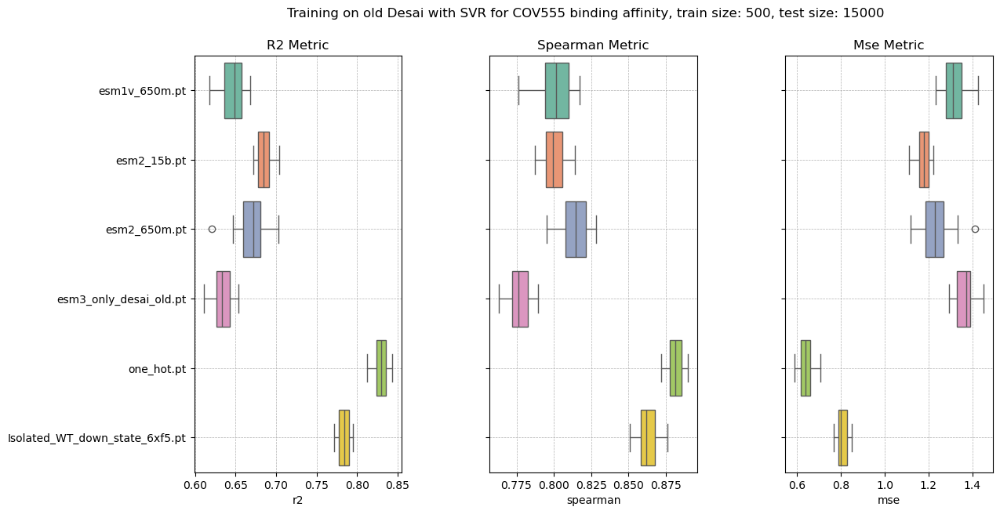

100%|███████████████████████████████████████████████████████████████████████████████████████| 120/120 [00:00<00:00, 137.32it/s]


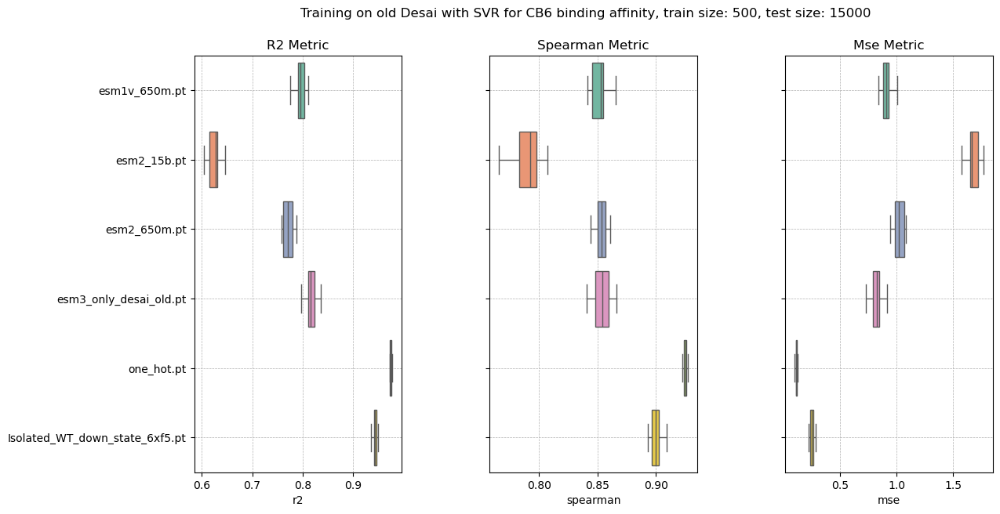

100%|████████████████████████████████████████████████████████████████████████████████████████| 120/120 [00:02<00:00, 50.75it/s]


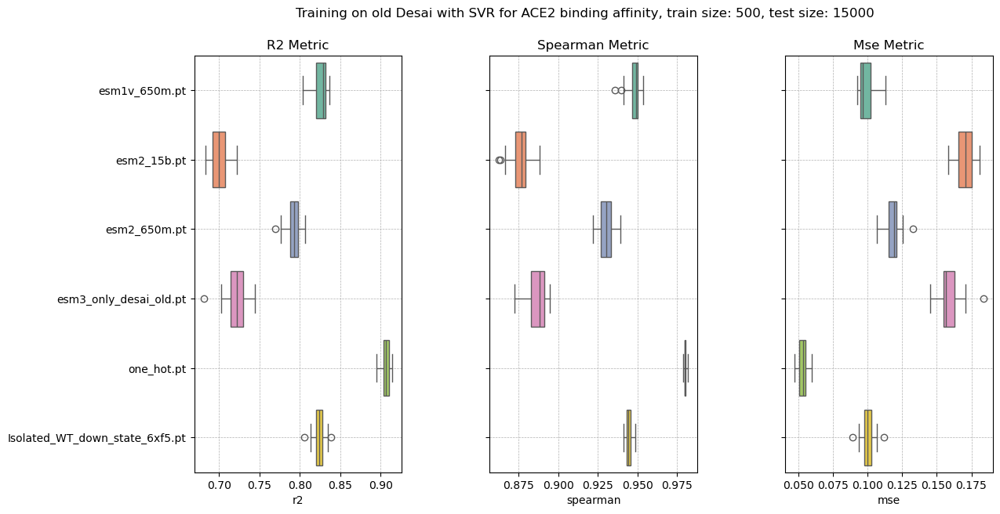

100%|███████████████████████████████████████████████████████████████████████████████████████| 120/120 [00:01<00:00, 105.85it/s]


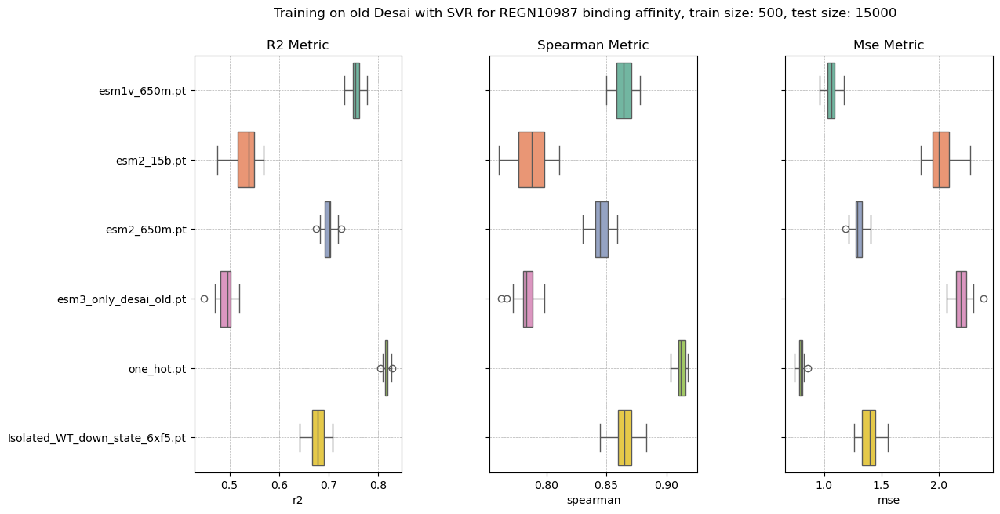

100%|████████████████████████████████████████████████████████████████████████████████████████| 120/120 [00:01<00:00, 64.44it/s]


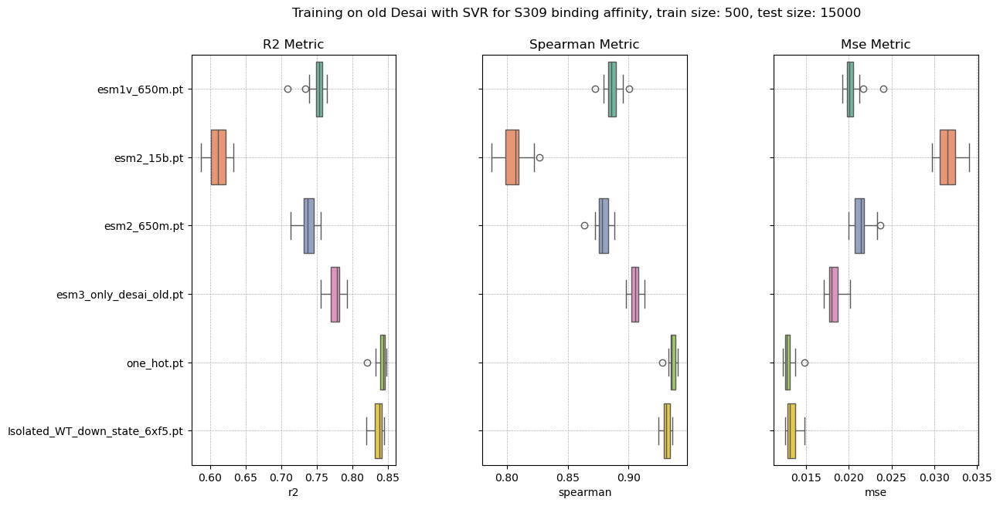

100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [02:48<00:00, 33.61s/it]


In [8]:
for i in tqdm(range(len(kd_names))):
    evaluate_embeddings_all_metrics_regression_multiprocessing(sequence_only_embeddings_normalize, KDs[i], SVR, sequence_only_embeddings_names, kd_names[i], num_repeats=20, train_size=500, test_size=15000, model_params={}, renormalize=True, prefix="sequence_vs_structure_")

### On all - sequence and structure

100%|████████████████████████████████████████████████████████████████████████████████████████| 220/220 [00:14<00:00, 14.70it/s]


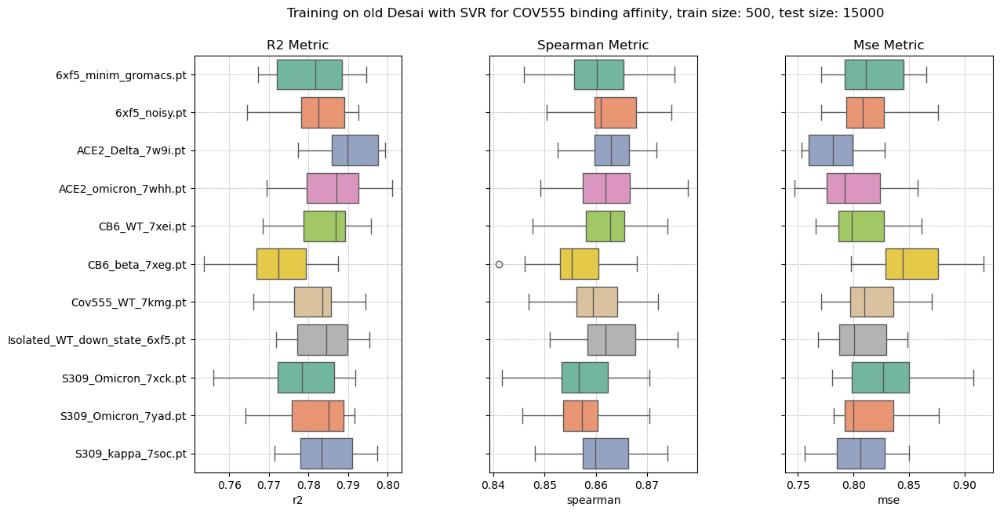

100%|████████████████████████████████████████████████████████████████████████████████████████| 220/220 [00:11<00:00, 18.98it/s]


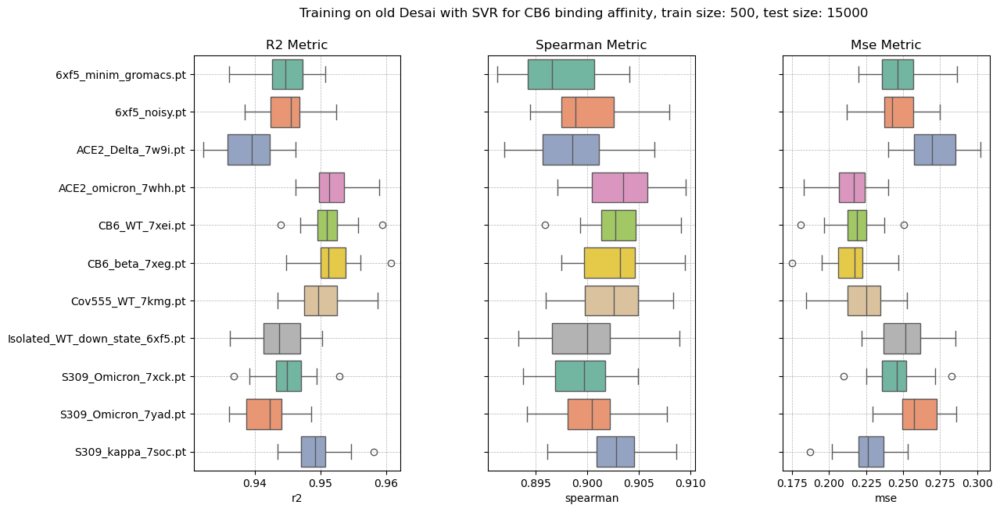

100%|████████████████████████████████████████████████████████████████████████████████████████| 220/220 [00:15<00:00, 14.21it/s]


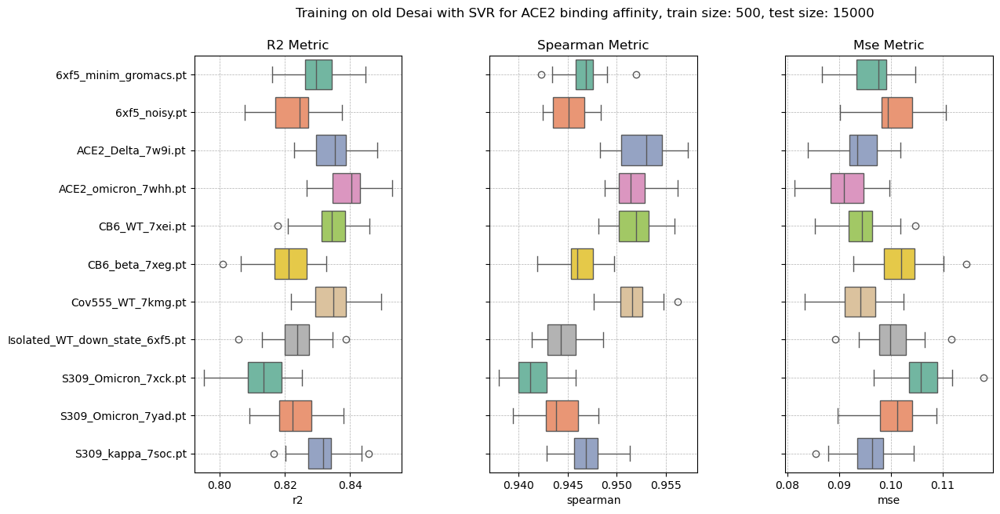

100%|████████████████████████████████████████████████████████████████████████████████████████| 220/220 [00:14<00:00, 14.80it/s]


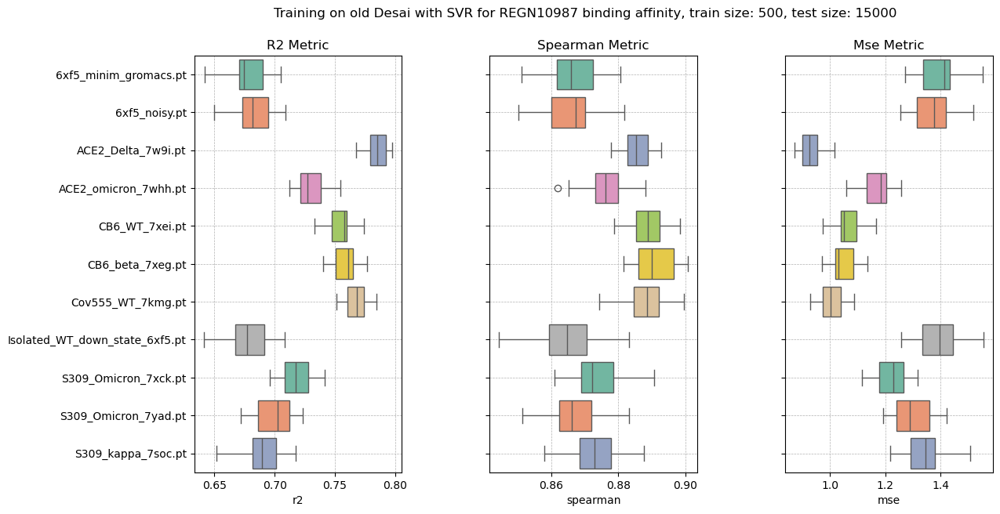

100%|████████████████████████████████████████████████████████████████████████████████████████| 220/220 [00:14<00:00, 14.83it/s]


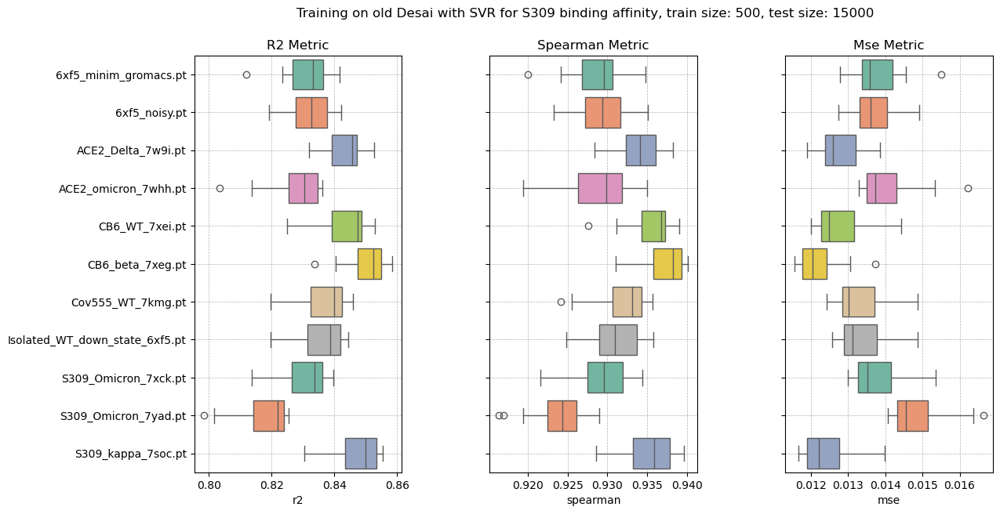

100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [01:58<00:00, 23.74s/it]


In [9]:
for i in tqdm(range(len(kd_names))):
    evaluate_embeddings_all_metrics_regression_multiprocessing(sequence_structure_embeddings_normalize, KDs[i], SVR, sequence_structure_embeddings_names, kd_names[i], num_repeats=20, train_size=500, test_size=15000, model_params={}, renormalize=True, prefix="structure_")

### On 6xf5 and mutated

#### RandomForest

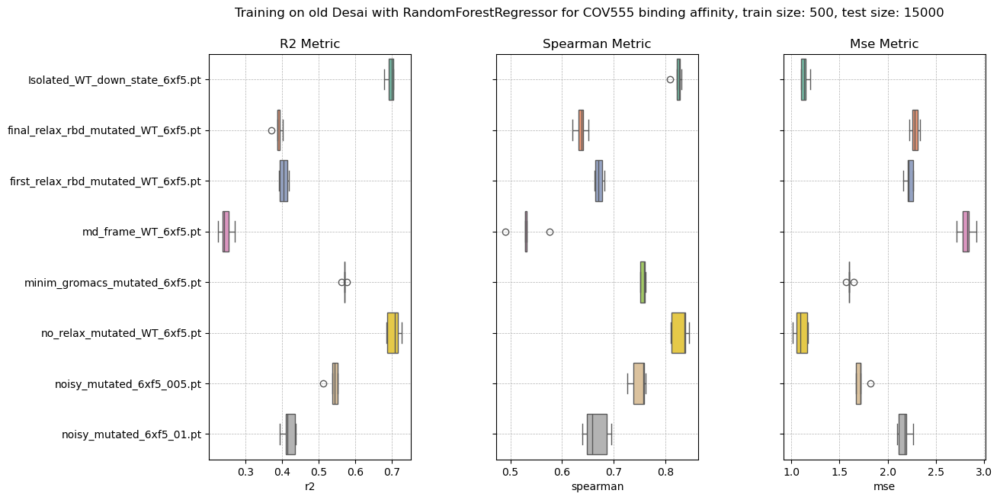

In [24]:
evaluate_embeddings_all_metrics_regression(mutated_embeddings[4:], KDs[0], RandomForestRegressor, mutated_embeddings_names[4:], kd_names[0], num_repeats=5, train_size=500, test_size=15000, model_params={"n_estimators":50, "n_jobs":-1}, prefix="mutated_")

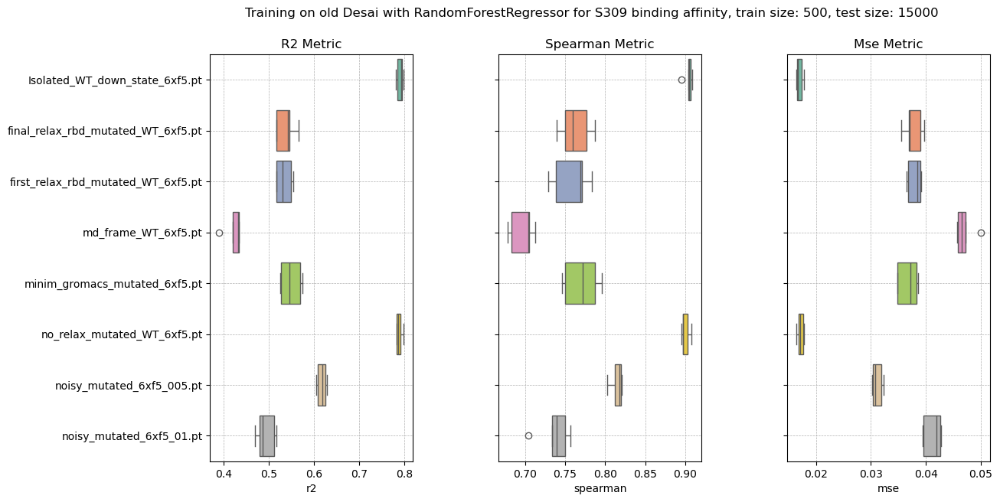

In [23]:
evaluate_embeddings_all_metrics_regression(mutated_embeddings[4:], KDs[-1], RandomForestRegressor, mutated_embeddings_names[4:], kd_names[-1], num_repeats=5, train_size=500, test_size=15000, model_params={"n_estimators":50, "n_jobs":-1}, prefix="mutated_")

In [15]:
evaluate_embeddings_all_metrics_regression(mutated_embeddings[4:], KDs[0], RandomForestRegressor, mutated_embeddings_names[4:], kd_names[0], num_repeats=1, train_size=5000, test_size=15000, model_params={"n_estimators":50, "n_jobs":-1}, prefix="mutated_", verbose=True)

  0%|                                                                                                                  | 0/1 [00:06<?, ?it/s]


KeyboardInterrupt: 

#### Linear Regression

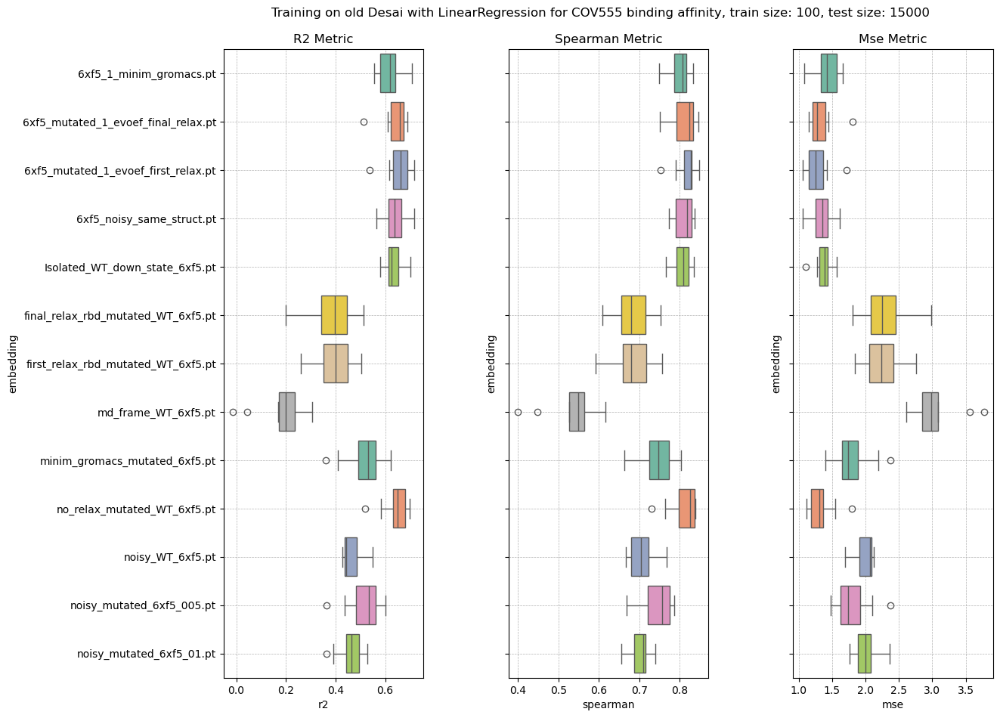

In [12]:
evaluate_embeddings_all_metrics_regression(mutated_embeddings[4:], KDs[0], LinearRegression, mutated_embeddings_names[4:], kd_names[0], num_repeats=10, train_size=100, test_size=15000, model_params={}, prefix="mutated_")

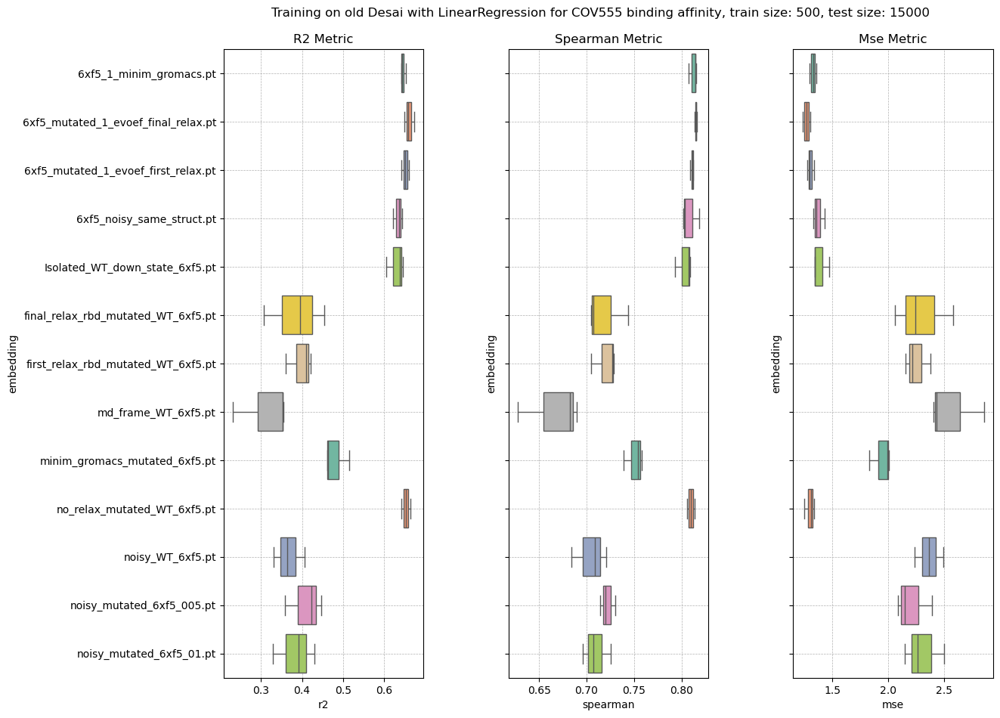

In [8]:
evaluate_embeddings_all_metrics_regression(mutated_embeddings[4:], KDs[0], LinearRegression, mutated_embeddings_names[4:], kd_names[0], num_repeats=3, train_size=500, test_size=15000, model_params={}, prefix="mutated_")

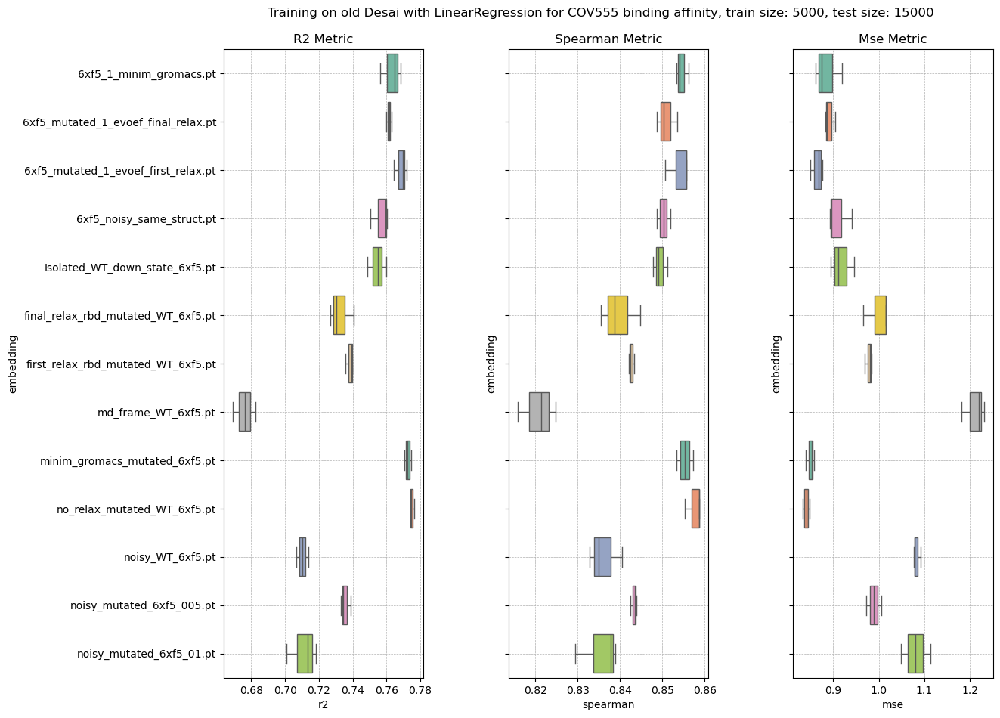

In [9]:
evaluate_embeddings_all_metrics_regression(mutated_embeddings, KDs[0], LinearRegression, mutated_embeddings_names, kd_names[0], num_repeats=3, train_size=5000, test_size=15000, model_params={}, prefix="mutated_")

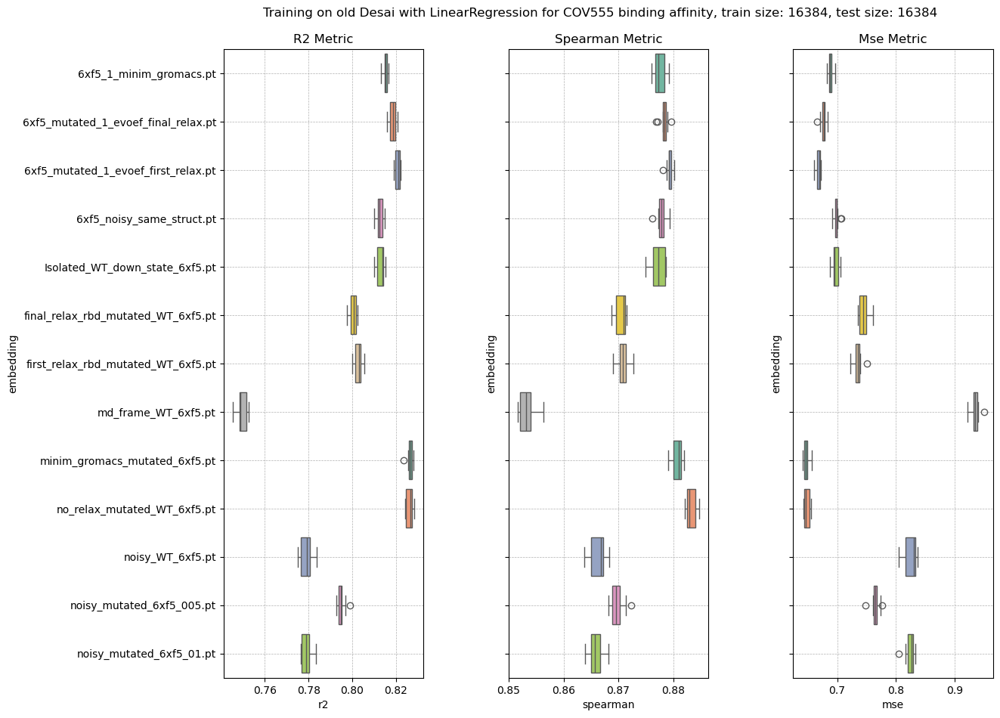

In [10]:
evaluate_embeddings_all_metrics_regression(mutated_embeddings, KDs[0], LinearRegression, mutated_embeddings_names, kd_names[0], num_repeats=10, train_size=0.5, test_size=0.5, model_params={}, prefix="mutated_")

### Final reports

100%|████████████████████████████████████████████████████████████████████████████████████████| 160/160 [00:10<00:00, 15.46it/s]


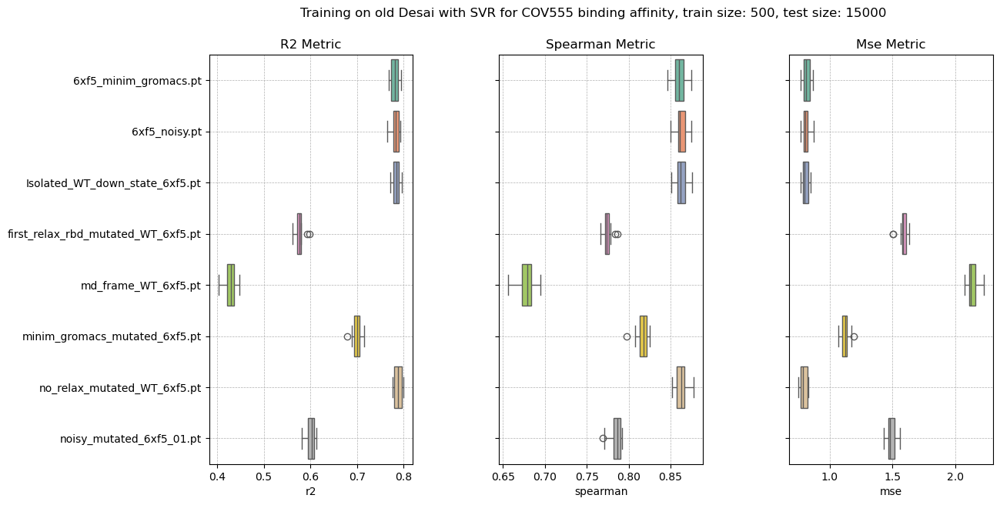

100%|████████████████████████████████████████████████████████████████████████████████████████| 160/160 [00:07<00:00, 22.07it/s]


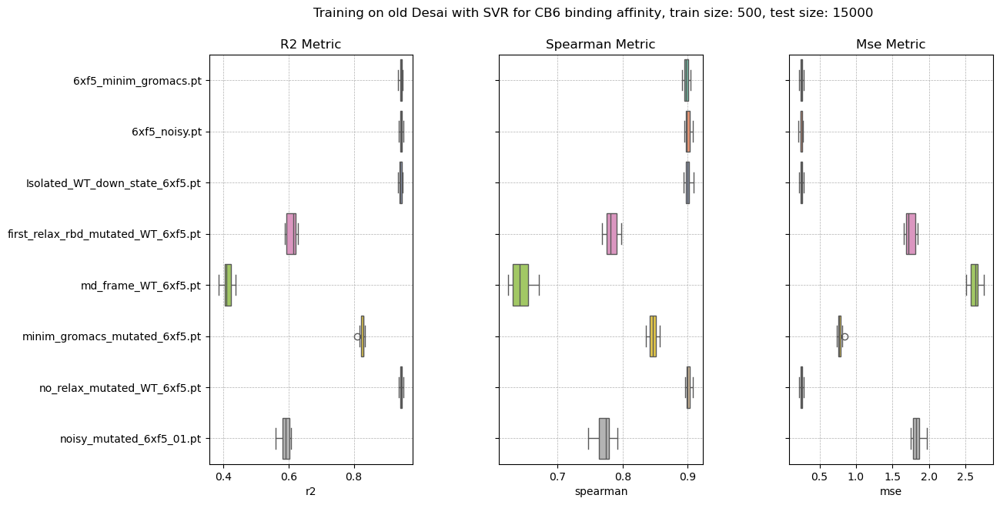

100%|████████████████████████████████████████████████████████████████████████████████████████| 160/160 [00:09<00:00, 16.45it/s]


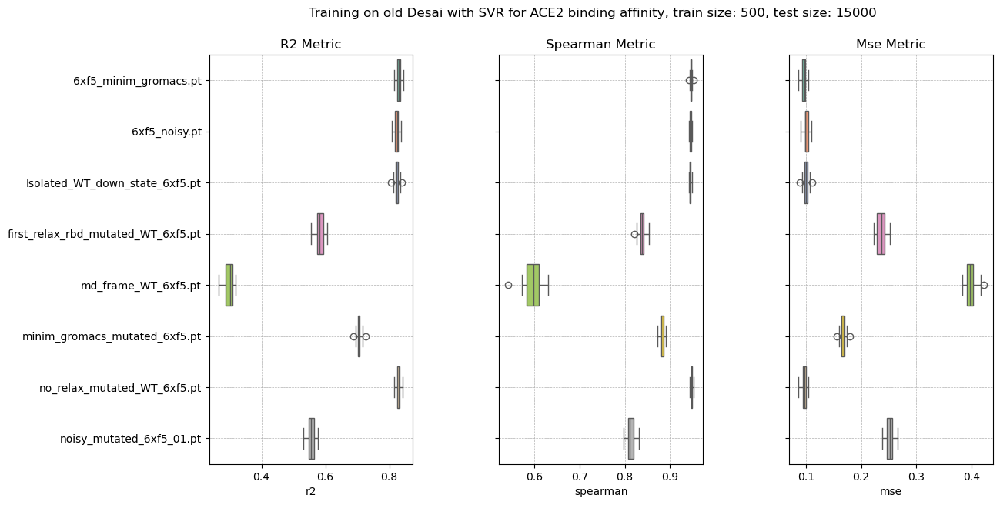

100%|████████████████████████████████████████████████████████████████████████████████████████| 160/160 [00:11<00:00, 14.29it/s]


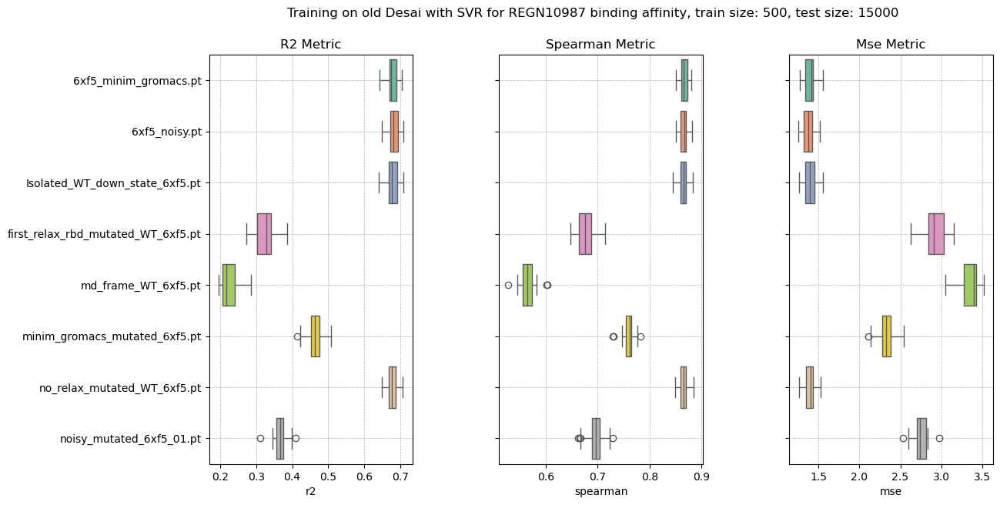

100%|████████████████████████████████████████████████████████████████████████████████████████| 160/160 [00:10<00:00, 15.81it/s]


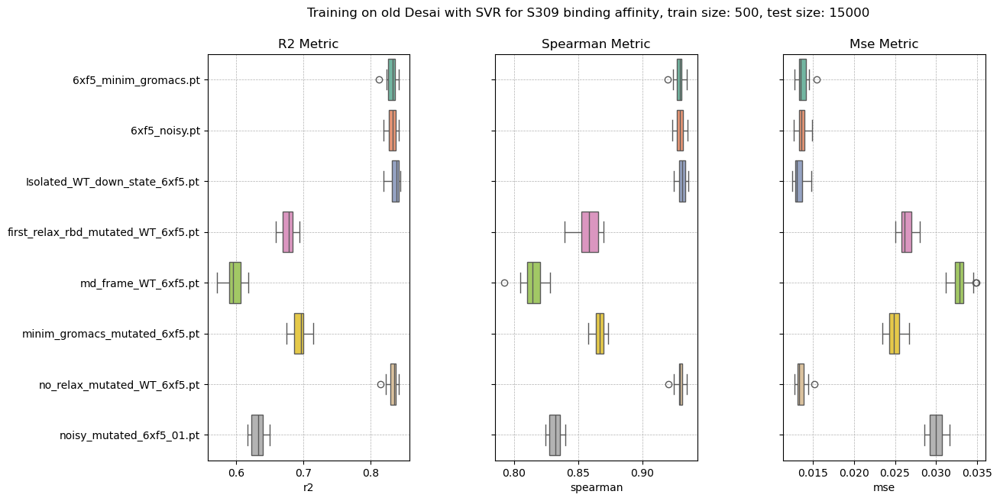

100%|████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [01:43<00:00, 20.60s/it]


In [10]:
for i in tqdm(range(len(kd_names))):
    evaluate_embeddings_all_metrics_regression_multiprocessing(mutated_embeddings_normalize, KDs[i], SVR, mutated_embeddings_names, kd_names[i], num_repeats=20, train_size=500, test_size=15000, model_params={}, renormalize=True, prefix="energy_minimization")

# Show all metrics to compare embeddings (Classification) (COV555 and S309)

In [16]:
def evaluate_embeddings_all_metrics_classification(embeddings_list, kd_Y, model_class, embeddings_name, kd_name, train_size=500, test_size=500, num_repeats=1, model_params={}, verbose=False, prefix=""):
    index = np.arange(len(embeddings_list[0]))
    # Select training and test data

    if num_repeats>1:
        seeds = np.arange(42, 42 + num_repeats)
    else:
        seeds = [np.random.randint(0, 1000)]
    results = []
    for ind, embeddings_X in enumerate(embeddings_list):
        for seed in tqdm(seeds, disable= not verbose):
            # Set seed for reproducibility
            np.random.seed(seed)

            index_train, index_test = train_test_split(index, test_size=test_size, train_size=train_size, random_state=seed)
            train_y = kd_Y[index_train]
            test_y = kd_Y[index_test]
            # Split the data into training and test sets
            train_X = embeddings_X[index_train]
            test_X = embeddings_X[index_test]

            # Set different random seeds for each repetition
            # seeds = np.arange(42, 42 + num_repeats)

            # Perform the benchmark
            model = model_class(**model_params)
            model.fit(train_X, train_y)
            predictions = model.predict(test_X)

            mask_binding = np.array((test_y > 5))
            test_y_binding = mask_binding.astype(int)

            # Roc curve
            fpr, tpr, thresholds = roc_curve(test_y_binding, predictions)
            roc_auc = auc(fpr, tpr)

            pred_binding = np.array((predictions > 5)).astype(int)

            # Accuracy
            accuracy = accuracy_score(test_y_binding, pred_binding)

            # F1
            f1 = f1_score(test_y_binding, pred_binding)

            results.append({"embedding": embeddings_name[ind], "roc_auc": roc_auc, "accuracy": accuracy, "f1": f1, "seed": seed})

    metrics = ['roc_auc', 'accuracy', 'f1']
    colours = ['b', 'g', 'r']

    # Create a figure and an array of subplots with one row per metric
    fig, axs = plt.subplots(1, len(metrics), figsize=(3*len(metrics), 6))
    fig.tight_layout(pad=5.0)

    results =  pd.DataFrame(results)
    
    # Plot each metric in a separate subplot
    for ax, colour, metric in zip(axs, colours, metrics):
        sns.boxplot(x=metric, y="embedding", hue='embedding', data=results, ax=ax, orient='h', palette='Set2', vert=False)

        ax.set_title(f'{metric.capitalize()} Metric')
        ax.grid(True, which="both", linestyle="--", linewidth=0.5)

        # Remove y-tick labels for all but the first subplot
        if ax != axs[0]:
            ax.set_yticklabels([])

    # Add a legend at the bottom for all metrics
    # legend_elements = [mpatches.Patch(color=colour, label=metric.capitalize()) for colour, metric in zip(colours, metrics)]
    # fig.legend(handles=legend_elements)

    plt.suptitle(f'Training on Old Desai on {kd_name}, train size: {train_X.shape[0]}, test size: {test_X.shape[0]}')
    fig.savefig(f'{prefix}{kd_name}_classification.png', bbox_inches='tight')
    plt.show()


In [23]:
def evaluate_classification(seed, embeddings_X, embedding_name, kd_Y, model_class, model_params, train_size, test_size, scaler=None):
    # Set seed for reproducibility
    index = np.arange(len(embeddings_X))
    np.random.seed(seed)

    index_train, index_test = train_test_split(index, test_size=test_size, train_size=train_size, random_state=seed)
    train_y = kd_Y[index_train]
    test_y = kd_Y[index_test]
    # Split the data into training and test sets
    train_X = embeddings_X[index_train]
    test_X = embeddings_X[index_test]

    # Set different random seeds for each repetition
    # seeds = np.arange(42, 42 + num_repeats)

    # Perform the benchmark
    model = model_class(**model_params)
    model.fit(train_X, train_y)
    predictions = model.predict(test_X)

    if scaler is not None:
        predictions = scaler.inverse_transform(predictions.reshape(-1, 1)).reshape(-1)
        test_y = scaler.inverse_transform(test_y.reshape(-1, 1)).reshape(-1)

    mask_binding = np.array((test_y > 5))
    test_y_binding = mask_binding.astype(int)

    # Roc curve
    fpr, tpr, thresholds = roc_curve(test_y_binding, predictions)
    roc_auc = auc(fpr, tpr)

    pred_binding = np.array((predictions > 5)).astype(int)

    # Accuracy
    accuracy = accuracy_score(test_y_binding, pred_binding)

    # F1
    f1 = f1_score(test_y_binding, pred_binding)

    return {"embedding": embedding_name, "roc_auc": roc_auc, "accuracy": accuracy, "f1": f1, "seed": seed}
    

def evaluate_embeddings_all_metrics_classification_multiprocessing(embeddings_list, kd_Y, model_class, embeddings_name, kd_name, train_size=500, test_size=500, num_repeats=1, model_params={}, verbose=False, prefix="", renormalize=False):
    index = np.arange(len(embeddings_list[0]))
    # Select training and test data

    if renormalize:
        kd_scaler = StandardScaler()
        kd_Y = kd_scaler.fit_transform(kd_Y.reshape(-1, 1)).reshape(-1)

    if num_repeats>1:
        seeds = np.arange(45, 45 + num_repeats)
    else:
        seeds = [np.random.randint(0, 1000)]

    with Pool(cpu_count()) as p:
        results = p.starmap(evaluate_classification, tqdm([(seed, embeddings_X, embeddings_name[ind], kd_Y, model_class, model_params, train_size, test_size, kd_scaler if renormalize else None) for ind, embeddings_X in enumerate(embeddings_list) for seed in seeds], total=len(embeddings_list)*len(seeds)))

    metrics = ['roc_auc', 'accuracy', 'f1']
    colours = ['b', 'g', 'r']

    # Create a figure and an array of subplots with one row per metric
    fig, axs = plt.subplots(1, len(metrics), figsize=(4*len(metrics), 7))
    fig.tight_layout(pad=5.0)

    results =  pd.DataFrame(results)
    
    # Plot each metric in a separate subplot
    for ax, colour, metric in zip(axs, colours, metrics):
        sns.boxplot(x=metric, y="embedding", hue='embedding', data=results, ax=ax, orient='h', palette='Set2', vert=False)
        # ax.set_xlabel('Spearman Correlation Coefficient')
        ax.set_title(f'{metric.capitalize()} Metric')
        ax.grid(True, which="both", linestyle="--", linewidth=0.5)
        ax.set_ylabel('')

        # Remove y-tick labels for all but the first subplot
        if ax != axs[0]:
            ax.set_yticklabels([])

    # Add a legend at the bottom for all metrics
    # legend_elements = [mpatches.Patch(color=colour, label=metric.capitalize()) for colour, metric in zip(colours, metrics)]
    # fig.legend(handles=legend_elements)
    plt.suptitle(f'Training on old Desai with {model_class.__name__} for {kd_name} binding affinity, train size: {train_size}, test size: {test_size}')
    fig.savefig(f'{prefix}{kd_name}_{model_class.__name__}_train_size_{train_size}_classification.png', bbox_inches='tight')
    plt.show()

### particular test

100%|████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:15<00:00,  1.05s/it]


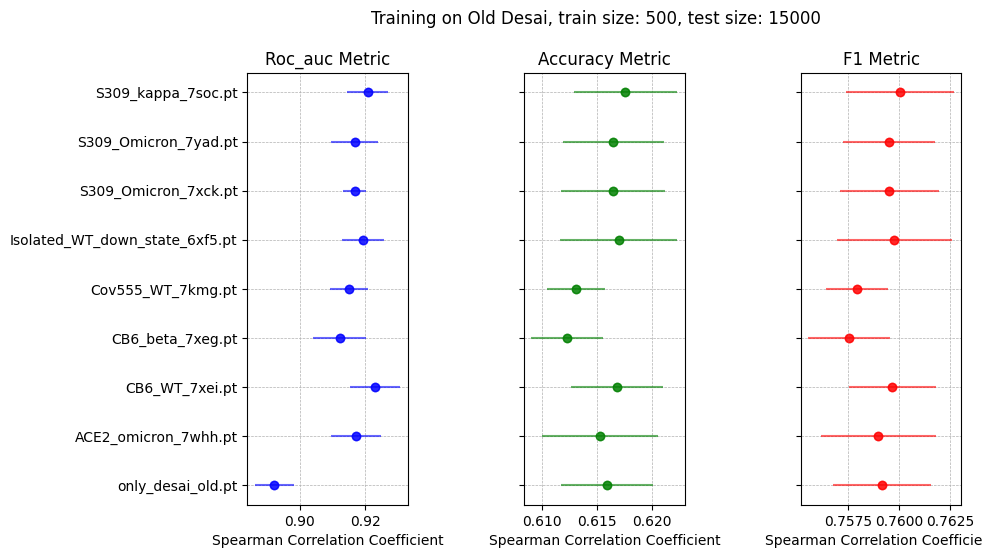

In [ ]:
evaluate_embeddings_all_metrics_classification(embeddings, kd_cov555, RandomForestRegressor, short_file_name, num_repeats=15, train_size=500, test_size=15000, model_params={"n_estimators":50, "n_jobs":-1})

100%|████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:14<00:00,  1.03it/s]


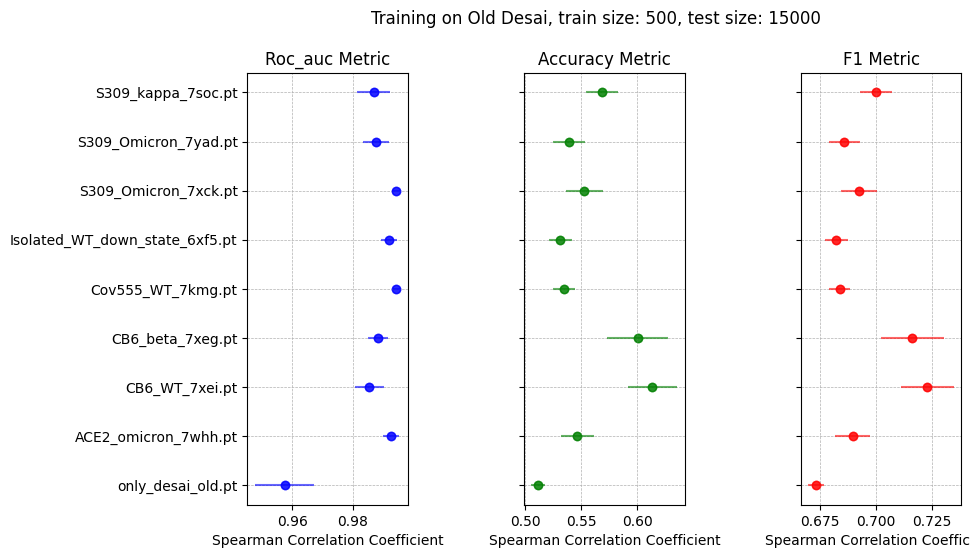

In [ ]:
evaluate_embeddings_all_metrics_classification(embeddings, kd_cb6, RandomForestRegressor, short_file_name, num_repeats=15, train_size=500, test_size=15000, model_params={"n_estimators":50, "n_jobs":-1})

### On all - sequence only

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:17<00:00,  1.13it/s]


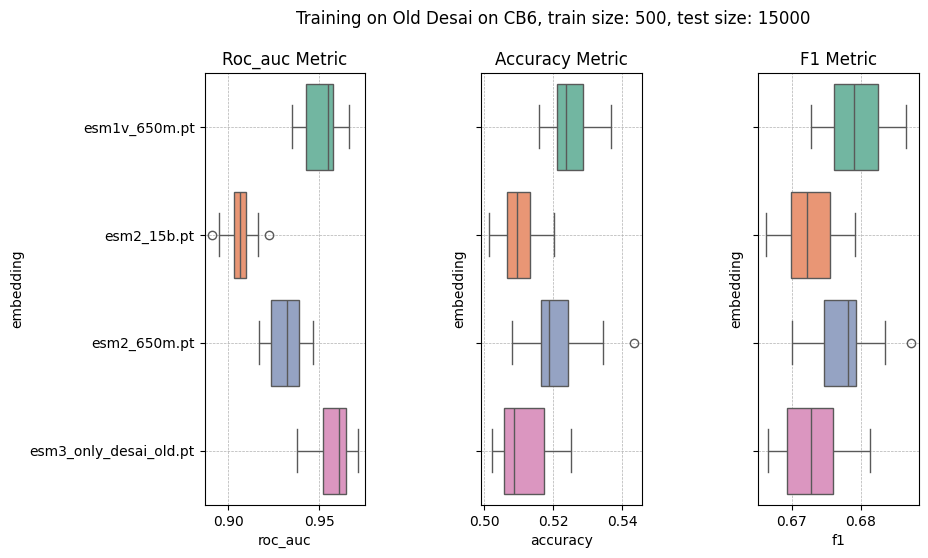

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:24<00:00,  1.24s/it]


<Figure size 640x480 with 0 Axes>

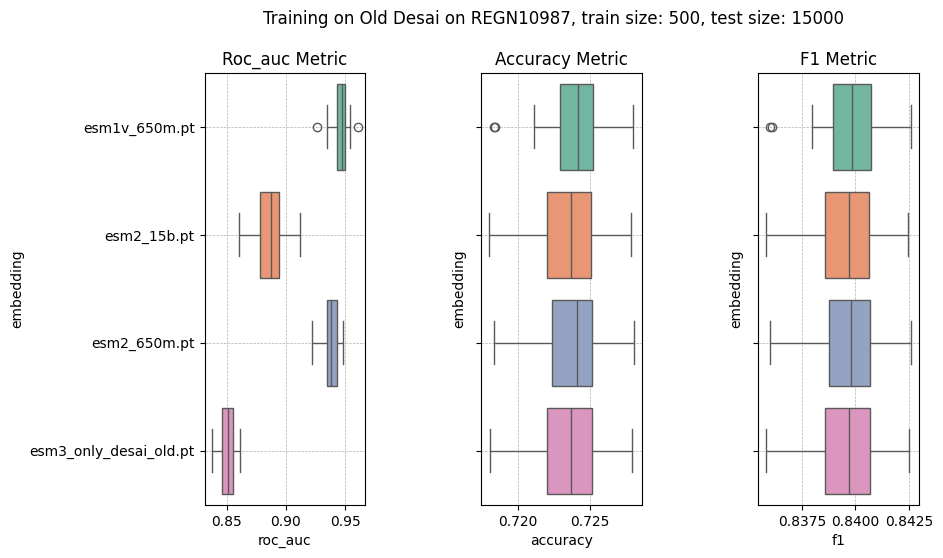

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:19<00:00,  1.04it/s]


<Figure size 640x480 with 0 Axes>

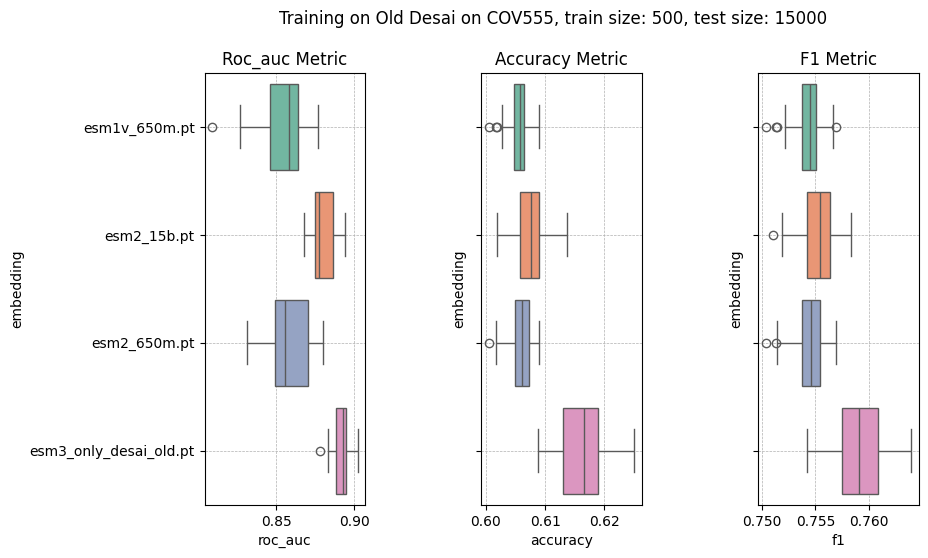

<Figure size 640x480 with 0 Axes>

In [47]:
for i in range(len(kd_escaping)):
    evaluate_embeddings_all_metrics_classification(sequence_only_embeddings, kd_escaping[i], RandomForestRegressor, sequence_only_embeddings_names, kd_escaping_names[i], num_repeats=20, train_size=500, test_size=15000, model_params={"n_estimators":50, "n_jobs":-1}, prefix="seq_only_")

### On all - sequence and structure

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:15<00:00,  1.26it/s]


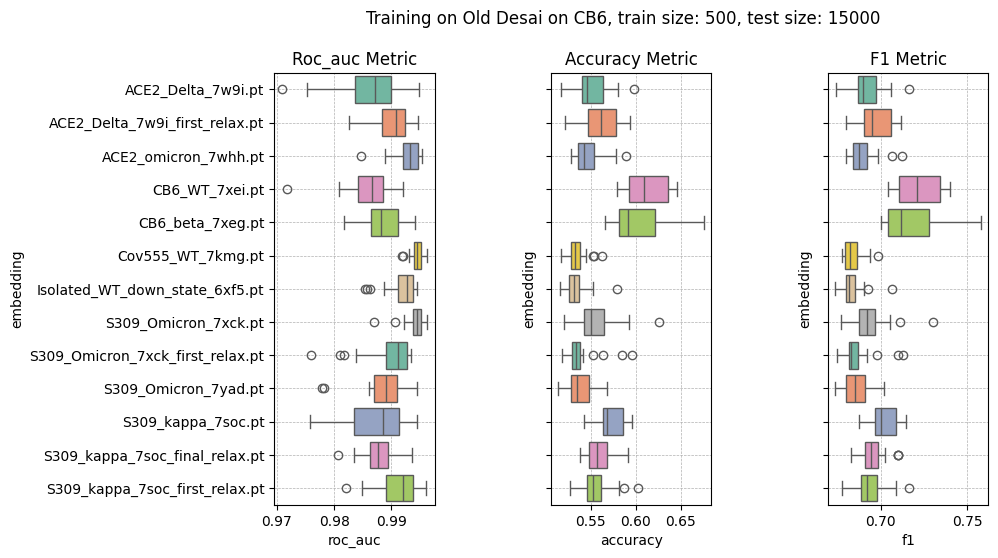

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:22<00:00,  1.15s/it]


<Figure size 640x480 with 0 Axes>

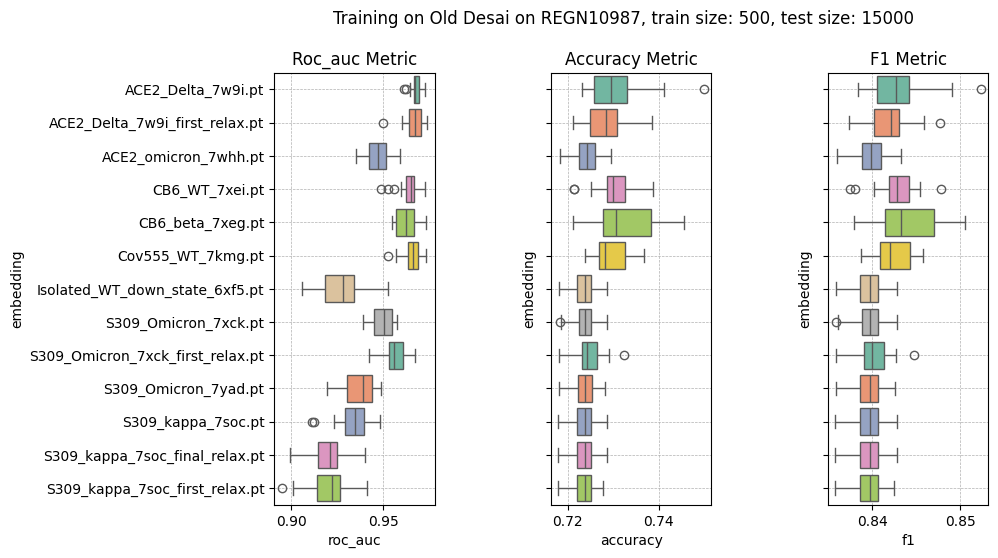

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:18<00:00,  1.09it/s]


<Figure size 640x480 with 0 Axes>

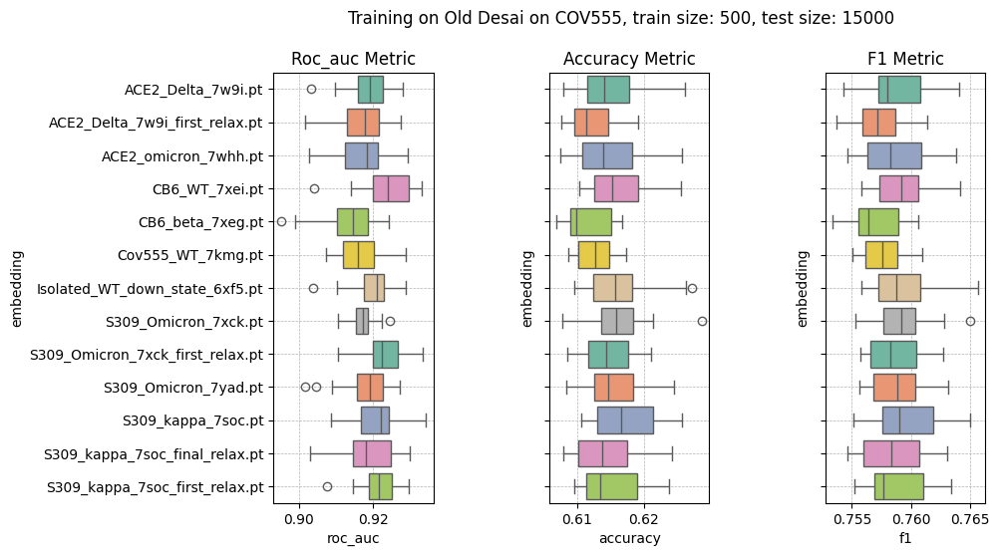

<Figure size 640x480 with 0 Axes>

In [48]:
for i in range(len(kd_escaping)):
    evaluate_embeddings_all_metrics_classification(sequence_structure_embeddings, kd_escaping[i], RandomForestRegressor, sequence_structure_embeddings_names, kd_escaping_names[i], num_repeats=20, train_size=500, test_size=15000, model_params={"n_estimators":50, "n_jobs":-1}, prefix="seq_and_struct_")

### On mutated

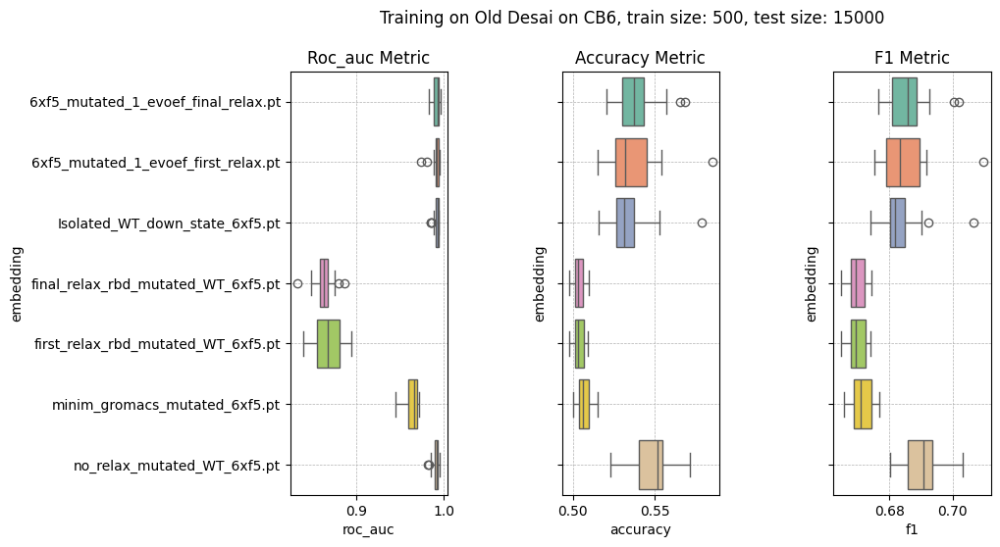

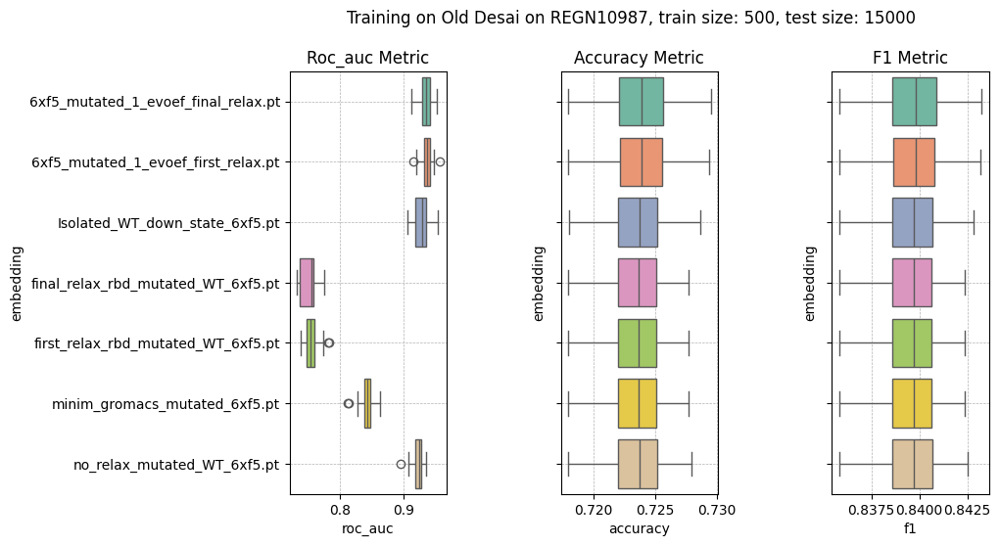

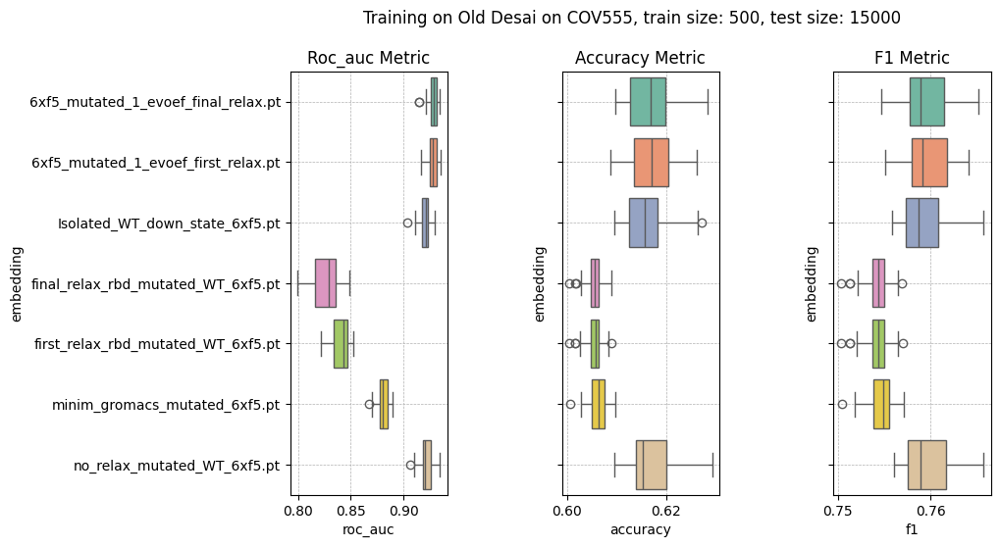

In [16]:
for i in range(len(kd_escaping)):
    evaluate_embeddings_all_metrics_classification(mutated_embeddings, kd_escaping[i], RandomForestRegressor, mutated_embeddings_names, kd_escaping_names[i], num_repeats=20, train_size=500, test_size=15000, model_params={"n_estimators":50, "n_jobs":-1}, prefix="seq_and_struct_")

### Test on REGN

100%|████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:00<00:00, 1874.72it/s]


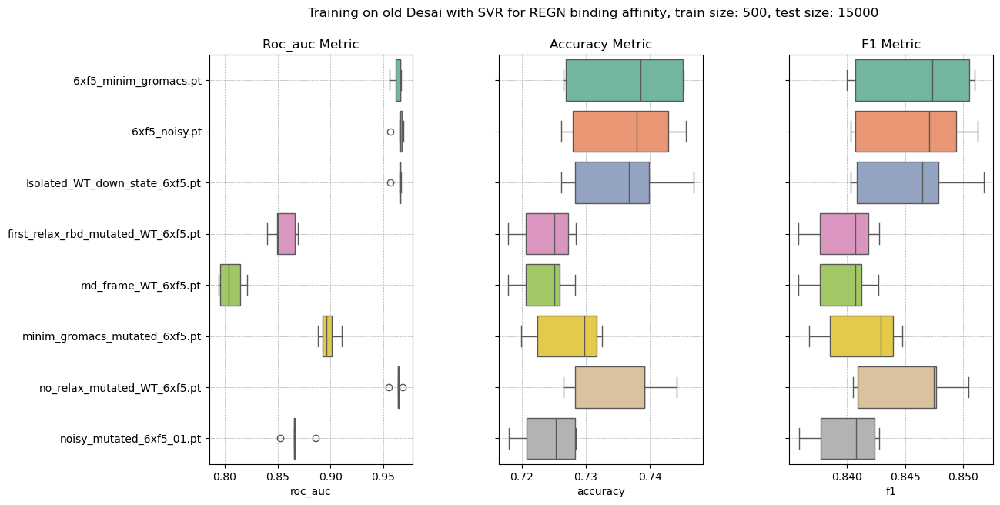

In [24]:
evaluate_embeddings_all_metrics_classification_multiprocessing(mutated_embeddings_normalize, kd_regn, SVR, mutated_embeddings_names, "REGN", num_repeats=5, train_size=500, test_size=15000, model_params={}, prefix="energy_minimization", renormalize=True)

100%|████████████████████████████████████████████████████████████████████████████████████████| 55/55 [00:00<00:00, 1281.88it/s]


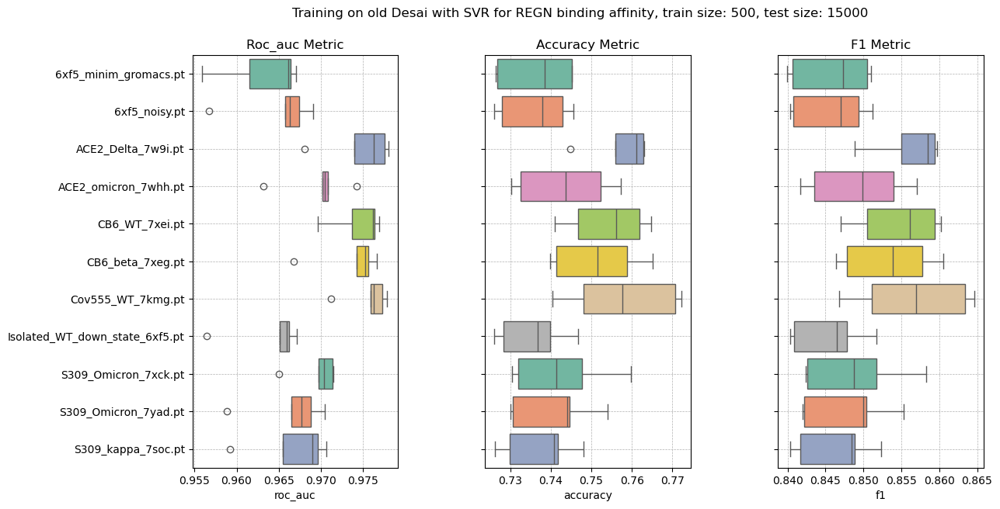

In [26]:
evaluate_embeddings_all_metrics_classification_multiprocessing(sequence_structure_embeddings_normalize, kd_regn, SVR, sequence_structure_embeddings_names, "REGN", num_repeats=5, train_size=500, test_size=15000, model_params={}, prefix="structure_", renormalize=True)

100%|████████████████████████████████████████████████████████████████████████████████████████| 55/55 [00:00<00:00, 1334.35it/s]


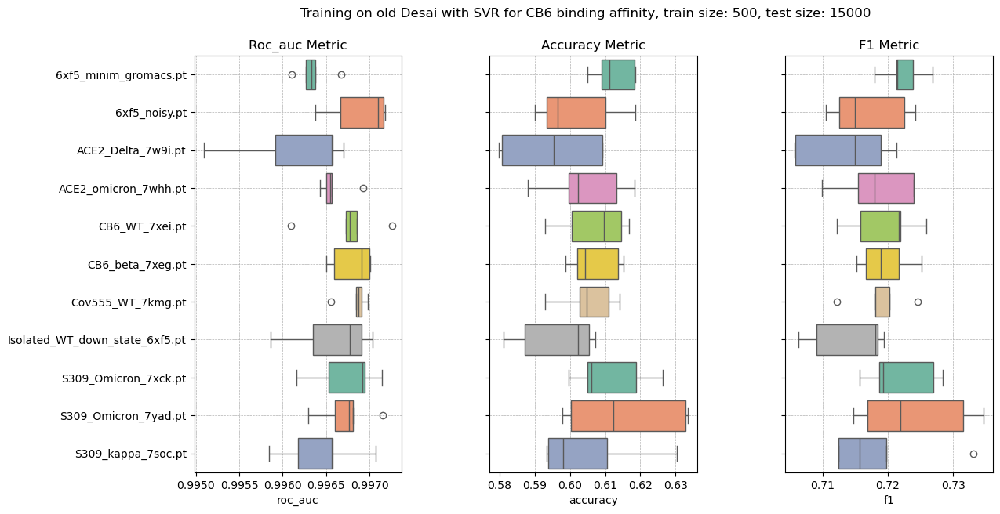

In [28]:
evaluate_embeddings_all_metrics_classification_multiprocessing(sequence_structure_embeddings_normalize, kd_cb6, SVR, sequence_structure_embeddings_names, "CB6", num_repeats=5, train_size=500, test_size=15000, model_params={}, prefix="structure_", renormalize=True)

100%|████████████████████████████████████████████████████████████████████████████████████████| 30/30 [00:00<00:00, 1738.74it/s]


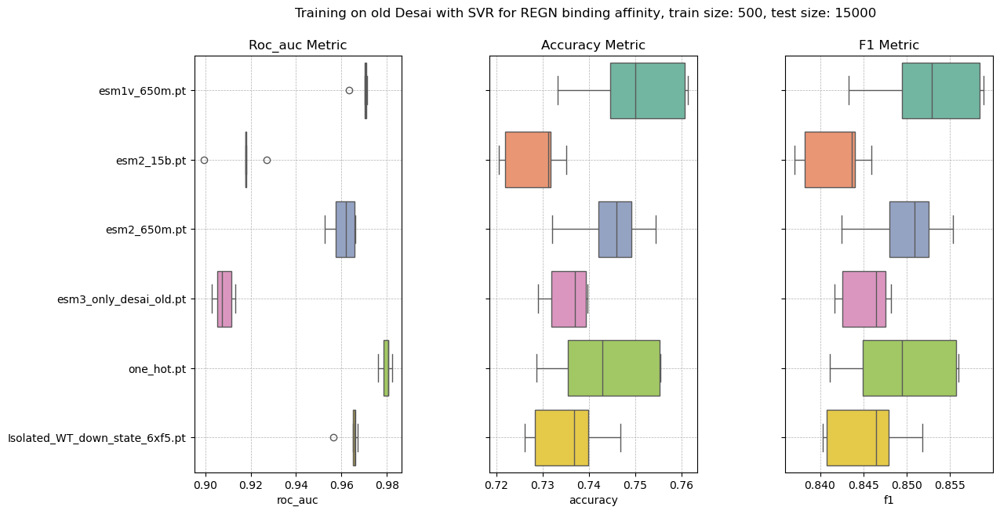

In [27]:
evaluate_embeddings_all_metrics_classification_multiprocessing(sequence_only_embeddings_normalize, kd_regn, SVR, sequence_only_embeddings_names, "REGN", num_repeats=5, train_size=500, test_size=15000, model_params={}, prefix="sequence_vs_structure", renormalize=True)

# Compare embeddings

In [ ]:
def evaluate_embeddings(embeddings_list, kd_Y, model_class, embeddings_name, train_size=500, test_size=500, num_repeats=1, model_params={}):
    index = np.arange(len(embeddings_list[0]))
    # Select training and test data

    if num_repeats>1:
        seeds = np.arange(42, 42 + num_repeats)
    else:
        seeds = [np.random.randint(0, 1000)]
    results = {name: {'r2': [] , 'spearman': [], 'mse': []} for name in embeddings_name}
    for ind, embeddings_X in enumerate(embeddings_list):
        for seed in tqdm(seeds):
            # Set seed for reproducibility
            np.random.seed(seed)

            index_train, index_test = train_test_split(index, test_size=test_size, train_size=train_size, random_state=seed)
            train_y = kd_Y[index_train]
            test_y = kd_Y[index_test]
            # Split the data into training and test sets
            train_X = embeddings_X[index_train]
            test_X = embeddings_X[index_test]

            # Set different random seeds for each repetition
            # seeds = np.arange(42, 42 + num_repeats)

            # Perform the benchmark
            model = model_class(**model_params)
            model.fit(train_X, train_y)
            predictions = model.predict(test_X)

            # Calculate R-squared (R2) score
            r2 = r2_score(test_y, predictions)
            # Calculate Spearman's correlation coefficient
            spearman, _ = spearmanr(predictions, test_y)
            # Calculate Mean Squared Error
            mse = mean_squared_error(test_y, predictions)

            results[embeddings_name[ind]]['r2'].append(r2)
            results[embeddings_name[ind]]['spearman'].append(spearman)
            results[embeddings_name[ind]]['mse'].append(mse)


    # Plot and compare the results
    plt.figure(figsize=(10, 6))
    plt.tight_layout()
    plt.grid(True, which="both", linestyle="--", linewidth=0.5)
    for name in embeddings_name:
        #plot average and std
        plt.errorbar(np.mean(results[name]['spearman']), name, fmt='o', alpha=0.6, xerr=np.std(results[name]['spearman']))
        plt.scatter(np.mean(results[name]['spearman']), name, alpha=0.6)
    plt.xlabel('Spearman Correlation Coefficient')
    plt.ylabel('Model')
    plt.title('Different embeddings (with or without structure), train size: '+str(train_X.shape[0])+', test size: '+str(test_X.shape[0]))
    plt.legend()
    plt.show()


  0%|                                                                                                                                                                      | 0/1 [00:00<?, ?it/s]

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  1.32it/s]
/tmp/ipykernel_1847960/766705435.py:53: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


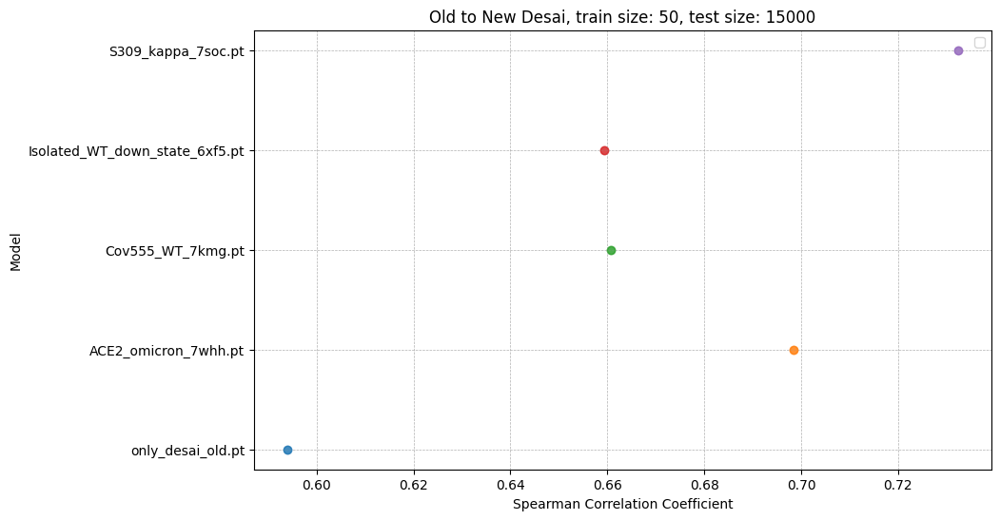

In [ ]:
evaluate_embeddings(embeddings, kd_cov555, RandomForestRegressor, short_file_name, num_repeats=1, train_size=50, test_size=15000, model_params={"n_estimators":50, "n_jobs":-1})

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:02<00:00,  7.52it/s]
/tmp/ipykernel_4171973/3850083284.py:52: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


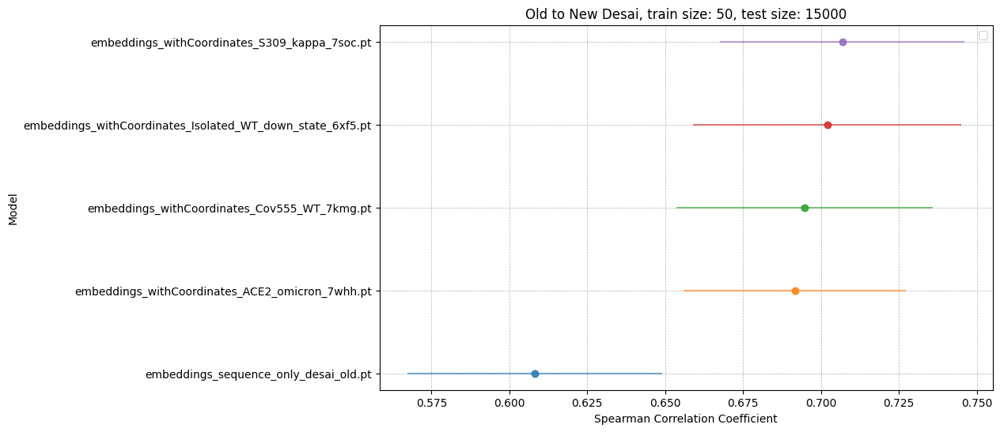

In [ ]:
evaluate_embeddings(embeddings, kd_cov555, RandomForestRegressor, files, num_repeats=20, train_size=50, test_size=15000, model_params={"n_estimators":50, "n_jobs":-1})

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:26<00:00,  1.31s/it]
/tmp/ipykernel_4171973/3850083284.py:52: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


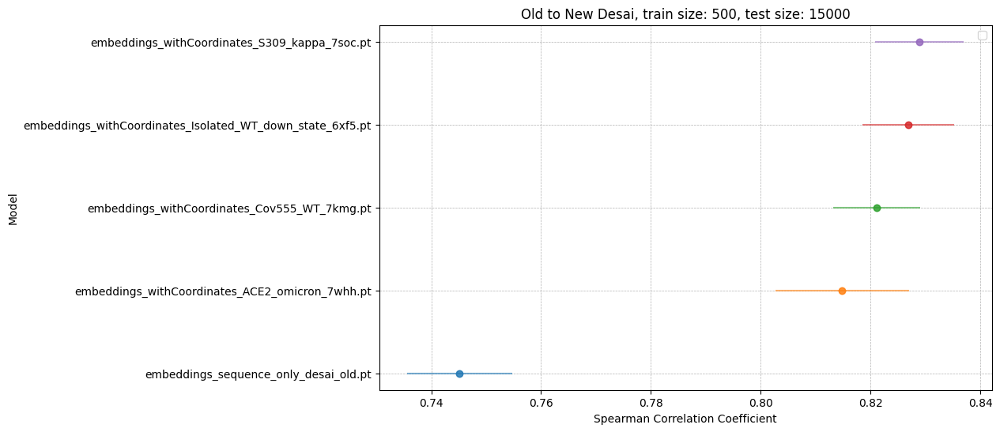

In [ ]:
evaluate_embeddings(embeddings, kd_cov555, RandomForestRegressor, files, num_repeats=20, train_size=500, test_size=15000, model_params={"n_estimators":50, "n_jobs":-1})

In [ ]:
evaluate_embeddings(embeddings, kd_s309, RandomForestRegressor, files, num_repeats=20, train_size=500, test_size=15000, model_params={"n_estimators":50, "n_jobs":-1})

# Clasffication, all embeddings VS all KDs

In [70]:
def evaluate_model_on_embeddings_classification(embeddings_X, kd_Y, model_class, seed, train_size=0.20, test_size=0.20, num_repeats=1, model_params={}):
    # Set seed for reproducibility
    index = np.arange(len(embeddings_X))
    np.random.seed(seed)

    index_train, index_test = train_test_split(index, test_size=test_size, train_size=train_size, random_state=seed)
    train_y = kd_Y[index_train]
    test_y = kd_Y[index_test]
    # Split the data into training and test sets
    train_X = embeddings_X[index_train]
    test_X = embeddings_X[index_test]

    # Set different random seeds for each repetition
    # seeds = np.arange(42, 42 + num_repeats)

    # Perform the benchmark
    model = model_class(**model_params)
    model.fit(train_X, train_y)
    predictions = model.predict(test_X)

    mask_binding = np.array((test_y > 5))
    test_y_binding = mask_binding.astype(int)

    # Roc curve
    fpr, tpr, thresholds = roc_curve(test_y_binding, predictions)
    roc_auc = auc(fpr, tpr)

    pred_binding = np.array((predictions > 5)).astype(int)

    # Accuracy
    accuracy = accuracy_score(test_y_binding, pred_binding)

    # Compute F1
    f1 = f1_score(test_y_binding, pred_binding)

    return roc_auc, accuracy, f1

def evaluate_embeddings_all_metrics_classification(embeddings_list, kd_Y_s, model_class, embeddings_name, kd_names, train_size=500, test_size=500, num_repeats=1, model_params={}):
    index = np.arange(len(embeddings_list[0]))
    # Select training and test data

    if num_repeats>1:
        seeds = np.arange(42, 42 + num_repeats)
    else:
        seeds = [np.random.randint(0, 1000)]
    results = [{name: {'roc_auc': [] , 'accuracy': [], 'f1': []} for name in embeddings_name} for i in range(len(kd_Y_s))]
    for ind, embeddings_X in enumerate(embeddings_list):
        for index_kd, kd_Y in enumerate(tqdm(kd_Y_s)):
            for seed in seeds:
                # Set seed for reproducibility
                roc_auc, accuracy, f1 = evaluate_model_on_embeddings_classification(embeddings_X, kd_Y, model_class, seed, train_size=train_size, test_size=test_size, num_repeats=num_repeats, model_params=model_params)

                results[index_kd][embeddings_name[ind]]['roc_auc'].append(roc_auc)
                results[index_kd][embeddings_name[ind]]['accuracy'].append(accuracy)
                results[index_kd][embeddings_name[ind]]['f1'].append(f1)

    metrics = ['roc_auc', 'accuracy', 'f1']
    colours = ['b', 'g', 'r']

    # Create a figure and an array of subplots with one row per metric
    fig, axs = plt.subplots(1, len(metrics), figsize=(5*len(metrics), 6))
    # imshow the results
    fig.tight_layout(pad=9.0)
    for ind, metric in enumerate(metrics):
        # plt.imshow([[np.mean(results[index_kd][name][metric]) for name in embeddings_name] for index_kd in range(len(kd_Y_s))], cmap='viridis', interpolation='nearest')
        # plt.colorbar()
        # plt.xticks(range(len(embeddings_name)), embeddings_name, rotation=45)
        # plt.yticks(range(len(kd_Y_s)), kd_Y_s)
        # plt.xlabel('Embeddings')
        # plt.ylabel('KD')
        # plt.title(f'{metric.capitalize()} Metric')
        axs[ind].imshow([[np.mean(results[index_kd][name][metric]) for name in embeddings_name] for index_kd in range(len(kd_Y_s))], cmap='viridis', interpolation='nearest')
        axs[ind].set_xticks(range(len(embeddings_name)))
        axs[ind].set_xticklabels(embeddings_name, rotation=45, ha='right')
        axs[ind].set_yticks(range(len(kd_Y_s)))
        axs[ind].set_yticklabels(kd_names)
        axs[ind].set_xlabel('Embeddings')
        axs[ind].set_ylabel('KD')
        axs[ind].set_title(f'{metric.capitalize()} Metric')
        axs[ind].grid(True, which="both", linestyle="--", linewidth=0.5)
        # add colorbar
        divider = make_axes_locatable(axs[ind])
        cax = divider.append_axes("right", size="5%", pad=0.05)
        plt.colorbar(axs[ind].imshow([[np.mean(results[index_kd][name][metric]) for name in embeddings_name] for index_kd in range(len(kd_Y_s))], cmap='viridis', interpolation='nearest'), cax=cax)

    plt.show()


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:06<00:00,  2.12s/it]


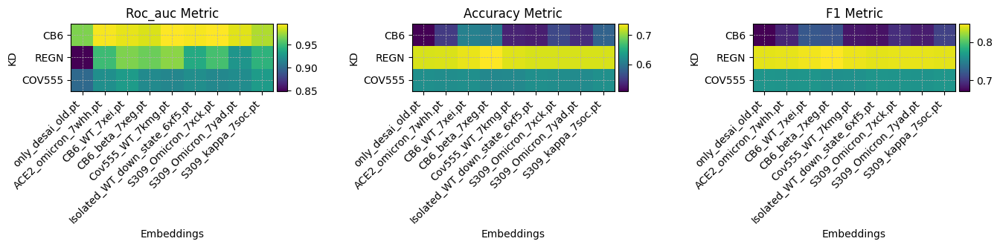

In [71]:
evaluate_embeddings_all_metrics_classification(embeddings, [kd_cb6, kd_regn, kd_cov555], RandomForestRegressor, short_file_name, ["CB6", "REGN", "COV555"], num_repeats=2, train_size=500, test_size=15000, model_params={"n_estimators":50, "n_jobs":-1})

# Regression, all embeddings VS all KDs

In [72]:
def evaluate_model_on_embeddings_regression(embeddings_X, kd_Y, model_class, seed, train_size=0.20, test_size=0.20, num_repeats=1, model_params={}):
    # Set seed for reproducibility
    index = np.arange(len(embeddings_X))
    np.random.seed(seed)

    index_train, index_test = train_test_split(index, test_size=test_size, train_size=train_size, random_state=seed)
    train_y = kd_Y[index_train]
    test_y = kd_Y[index_test]
    # Split the data into training and test sets
    train_X = embeddings_X[index_train]
    test_X = embeddings_X[index_test]

    # Set different random seeds for each repetition
    # seeds = np.arange(42, 42 + num_repeats)

    # Perform the benchmark
    model = model_class(**model_params)
    model.fit(train_X, train_y)
    predictions = model.predict(test_X)

    # Calculate R-squared (R2) score
    r2 = r2_score(test_y, predictions)
    # Calculate Spearman's correlation coefficient
    spearman, _ = spearmanr(predictions, test_y)
    # Calculate Mean Squared Error
    mse = mean_squared_error(test_y, predictions)

    return r2, spearman, mse

def evaluate_embeddings_all_metrics_regression(embeddings_list, kd_Y_s, model_class, embeddings_name, kd_names, train_size=500, test_size=500, num_repeats=1, model_params={}):
    index = np.arange(len(embeddings_list[0]))
    # Select training and test data

    if num_repeats>1:
        seeds = np.arange(42, 42 + num_repeats)
    else:
        seeds = [np.random.randint(0, 1000)]
    results = [{name: {'r2': [] , 'spearman': [], 'mse': []} for name in embeddings_name} for i in range(len(kd_Y_s))]
    for ind, embeddings_X in enumerate(embeddings_list):
        for index_kd, kd_Y in enumerate(tqdm(kd_Y_s)):
            for seed in seeds:
                # Set seed for reproducibility
                r2, spearman, mse = evaluate_model_on_embeddings_regression(embeddings_X, kd_Y, model_class, seed, train_size=train_size, test_size=test_size, num_repeats=num_repeats, model_params=model_params)

                results[index_kd][embeddings_name[ind]]['r2'].append(r2)
                results[index_kd][embeddings_name[ind]]['spearman'].append(spearman)
                results[index_kd][embeddings_name[ind]]['mse'].append(mse)

    metrics = ['r2', 'spearman', 'mse']
    colours = ['b', 'g', 'r']

    # Create a figure and an array of subplots with one row per metric
    fig, axs = plt.subplots(1, len(metrics), figsize=(5*len(metrics), 6))
    # imshow the results
    fig.tight_layout(pad=9.0)
    for ind, metric in enumerate(metrics):
        # plt.imshow([[np.mean(results[index_kd][name][metric]) for name in embeddings_name] for index_kd in range(len(kd_Y_s))], cmap='viridis', interpolation='nearest')
        # plt.colorbar()
        # plt.xticks(range(len(embeddings_name)), embeddings_name, rotation=45)
        # plt.yticks(range(len(kd_Y_s)), kd_Y_s)
        # plt.xlabel('Embeddings')
        # plt.ylabel('KD')
        # plt.title(f'{metric.capitalize()} Metric')
        axs[ind].imshow([[np.mean(results[index_kd][name][metric]) for name in embeddings_name] for index_kd in range(len(kd_Y_s))], cmap='viridis', interpolation='nearest')
        axs[ind].set_xticks(range(len(embeddings_name)))
        axs[ind].set_xticklabels(embeddings_name, rotation=45, ha='right')
        axs[ind].set_yticks(range(len(kd_Y_s)))
        axs[ind].set_yticklabels(kd_names)
        axs[ind].set_xlabel('Embeddings')
        axs[ind].set_ylabel('KD')
        axs[ind].set_title(f'{metric.capitalize()} Metric')
        axs[ind].grid(True, which="both", linestyle="--", linewidth=0.5)
        # add colorbar
        divider = make_axes_locatable(axs[ind])
        cax = divider.append_axes("right", size="5%", pad=0.05)
        plt.colorbar(axs[ind].imshow([[np.mean(results[index_kd][name][metric]) for name in embeddings_name] for index_kd in range(len(kd_Y_s))], cmap='viridis', interpolation='nearest'), cax=cax)

    plt.show()


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:16<00:00,  3.29s/it]


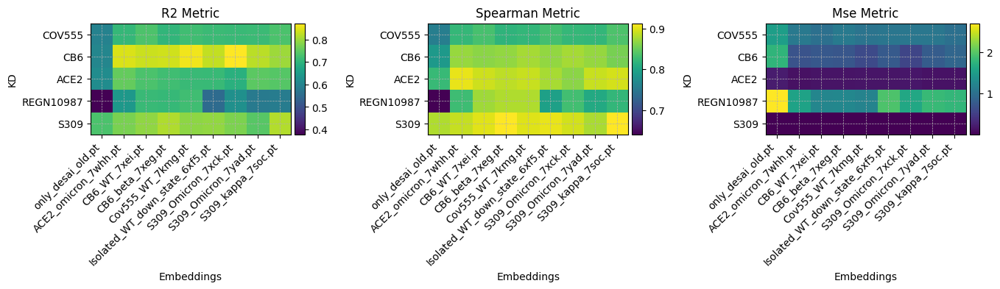

In [74]:
evaluate_embeddings_all_metrics_regression(embeddings, KDs, RandomForestRegressor, short_file_name, kd_names, num_repeats=3, train_size=500, test_size=15000, model_params={"n_estimators":50, "n_jobs":-1})

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:09<00:00,  3.33s/it]


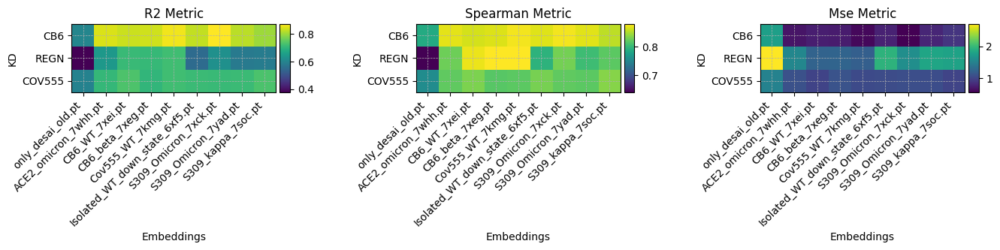

In [75]:
evaluate_embeddings_all_metrics_regression(embeddings, [kd_cb6, kd_regn, kd_cov555], RandomForestRegressor, short_file_name, ["CB6", "REGN", "COV555"], num_repeats=3, train_size=500, test_size=15000, model_params={"n_estimators":50, "n_jobs":-1})

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:18<00:00,  9.00s/it]


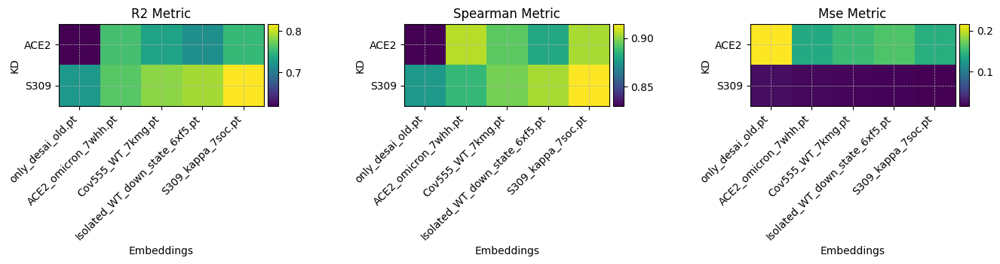

In [56]:
evaluate_embeddings_all_metrics_regression(embeddings, [kd_ace, kd_s309], RandomForestRegressor, short_file_name, ["ACE2", "S309"], num_repeats=10, train_size=500, test_size=15000, model_params={"n_estimators":50, "n_jobs":-1})

# Regression plot

In [13]:
def regression_plot(embeddings_X, kd_Y, model, embedding_name, on="all", train_size=0.2, test_size=0.2, renormalize=False):
    # Split the data into training and test sets
    assert on in ["all", "binding", "nonbinding"]
    if renormalize:
        embeddings_X = normalize_embeddings(embeddings_X)
        scaler_kd = StandardScaler()
        kd_Y = kd_Y.numpy()
        kd_Y = scaler_kd.fit_transform(kd_Y.reshape(-1, 1)).flatten()
        
    if on == "binding":
        mask_binding = np.array((kd_Y > 5.5))
        train_X, test_X, train_y, test_y = train_test_split(embeddings_X[mask_binding], kd_Y[mask_binding], test_size=test_size, train_size=train_size)
    else:
        train_X, test_X, train_y, test_y = train_test_split(embeddings_X, kd_Y, test_size=test_size, train_size=train_size)
    # np.random.seed(42)
    # Train the model
    model.fit(train_X, train_y)

    # Make predictions on the test data
    predictions = model.predict(test_X)
    if renormalize:
        predictions = scaler_kd.inverse_transform(predictions.reshape(-1, 1)).flatten()
        test_y = scaler_kd.inverse_transform(test_y.reshape(-1, 1)).flatten()

    # Calculate R-squared (R2) score
    r2 = r2_score(test_y, predictions)

    # Calculate Spearman's correlation coefficient
    spearman, _ = spearmanr(predictions, test_y)

    # Calculate Mean Squared Error
    mse = mean_squared_error(test_y, predictions)

    graph_2D = np.array([test_y, predictions])
    density = gaussian_kde(graph_2D)(graph_2D)

    # Plot the predictions against the true values
    plt.figure(figsize=(10, 6))
    plt.scatter(test_y, predictions, alpha=0.6, c=density)
    plt.plot([min(test_y), max(test_y)], [min(test_y), max(test_y)], 'k--', lw=2)
    plt.xlabel('True Values')
    plt.ylabel('Predictions')
    plt.title(f'Predictions vs True Values from {embedding_name}')
    plt.legend(["R2: {:.4f}, Spearman: {:.4f}, MSE: {:.4f}".format(r2, spearman, mse)])
    plt.colorbar()
    plt.show()

    # Plot density of the predictions and true values
    plt.figure(figsize=(10, 6))
    density_test_y = gaussian_kde(test_y)(test_y)
    density_predictions = gaussian_kde(predictions)(predictions)
    plt.scatter(test_y, density_test_y, alpha=0.6)
    plt.scatter(predictions, density_predictions, alpha=0.6)
    plt.xlabel('Values')
    plt.ylabel('Density')
    plt.title(f'Density of Predictions and True Values from {embedding_name}')
    plt.legend(["True Values", "Predictions"])
    plt.show()



In [26]:
mutated_embeddings_names

['6xf5_1_minim_gromacs.pt',
 '6xf5_mutated_1_evoef_final_relax.pt',
 '6xf5_mutated_1_evoef_first_relax.pt',
 '6xf5_noisy_same_struct.pt',
 'Isolated_WT_down_state_6xf5.pt',
 'final_relax_rbd_mutated_WT_6xf5.pt',
 'first_relax_rbd_mutated_WT_6xf5.pt',
 'md_frame_WT_6xf5.pt',
 'minim_gromacs_mutated_6xf5.pt',
 'no_relax_mutated_WT_6xf5.pt',
 'noisy_mutated_6xf5_005.pt',
 'noisy_mutated_6xf5_01.pt']

In [28]:
sns.set_theme(style="whitegrid")

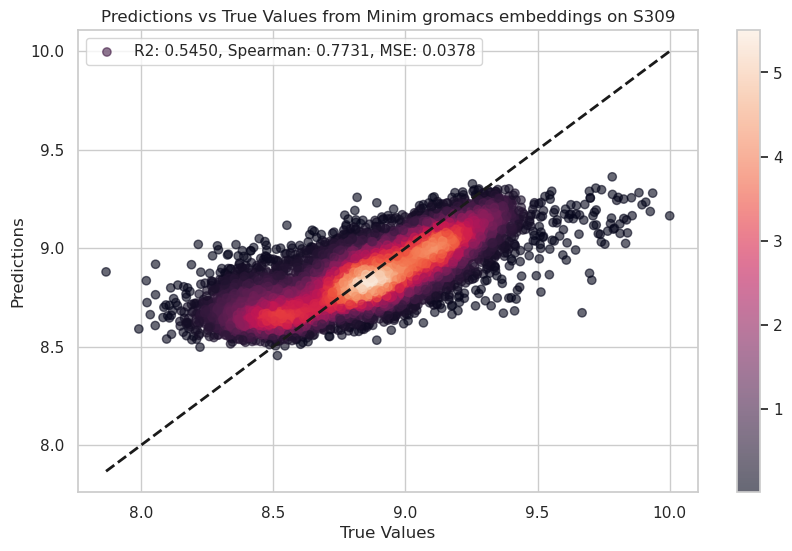

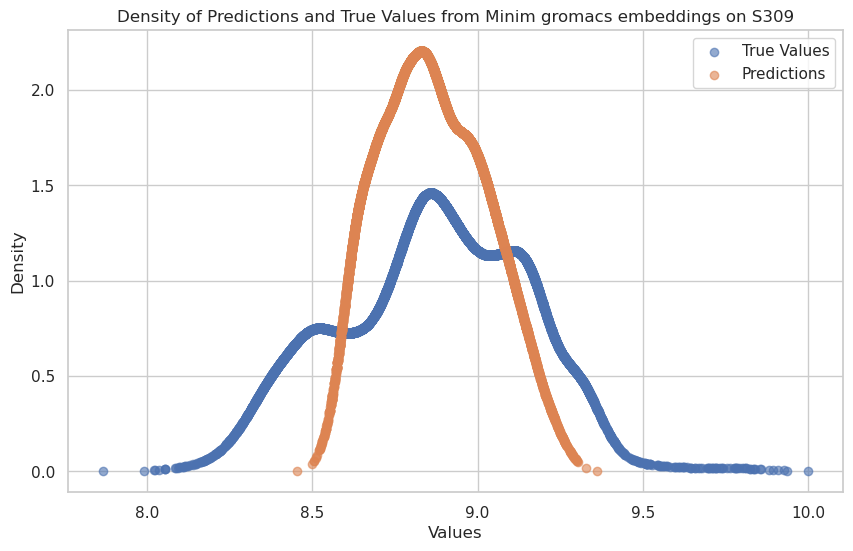

In [31]:
regression_plot(mutated_embeddings[-4], kd_s309, RandomForestRegressor(n_estimators=50, n_jobs=-1), "Minim gromacs embeddings on S309", on="all", train_size=500, test_size=10000)

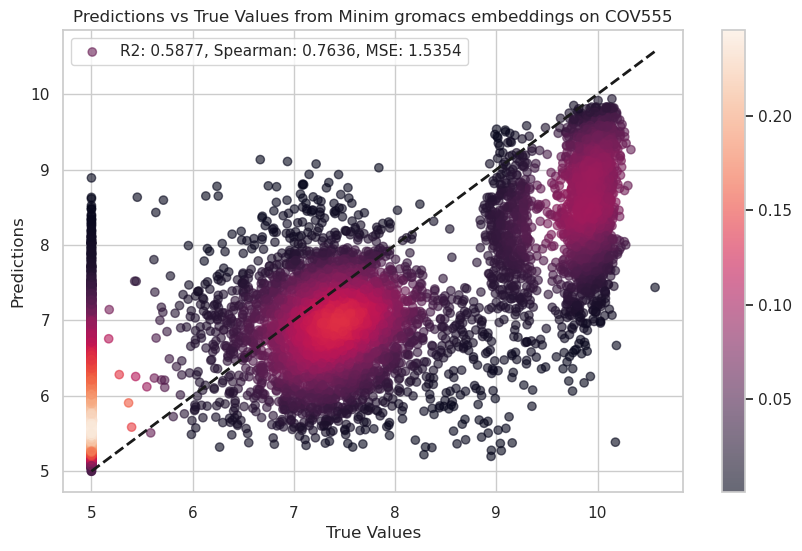

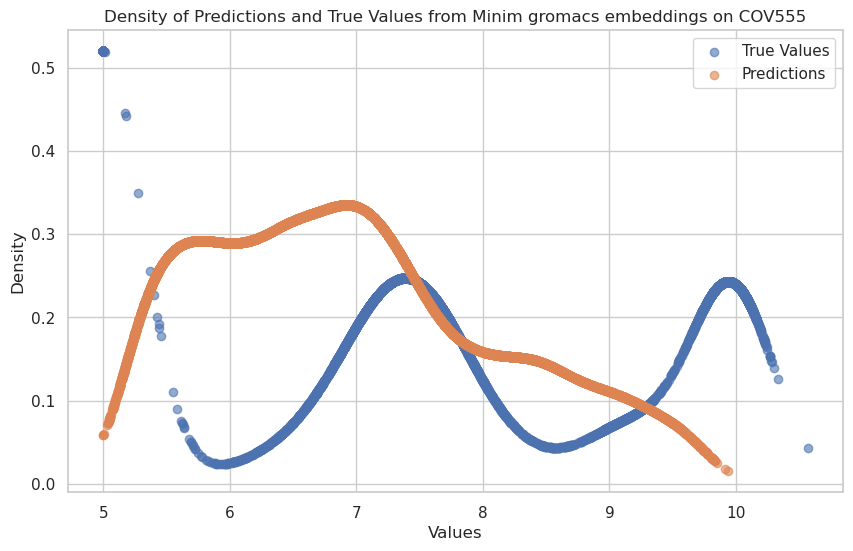

In [32]:
regression_plot(mutated_embeddings[-4], kd_cov555, RandomForestRegressor(n_estimators=50, n_jobs=-1), "Minim gromacs embeddings on COV555", on="all", train_size=500, test_size=10000)

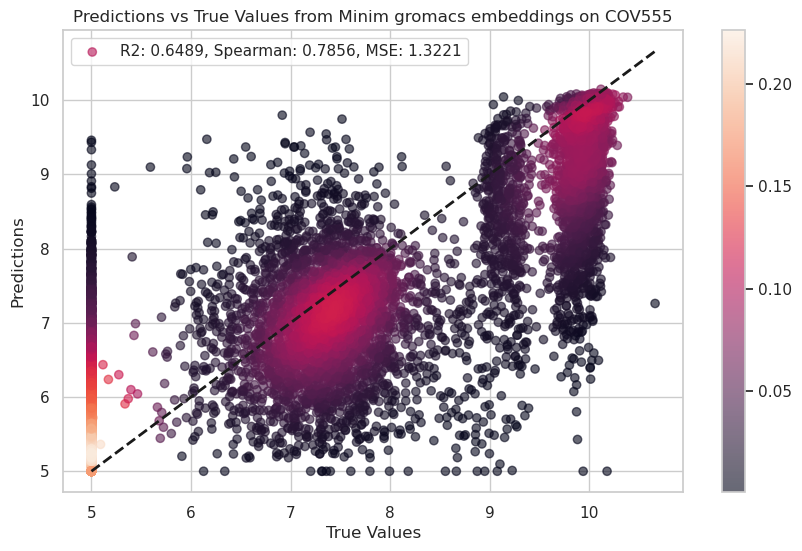

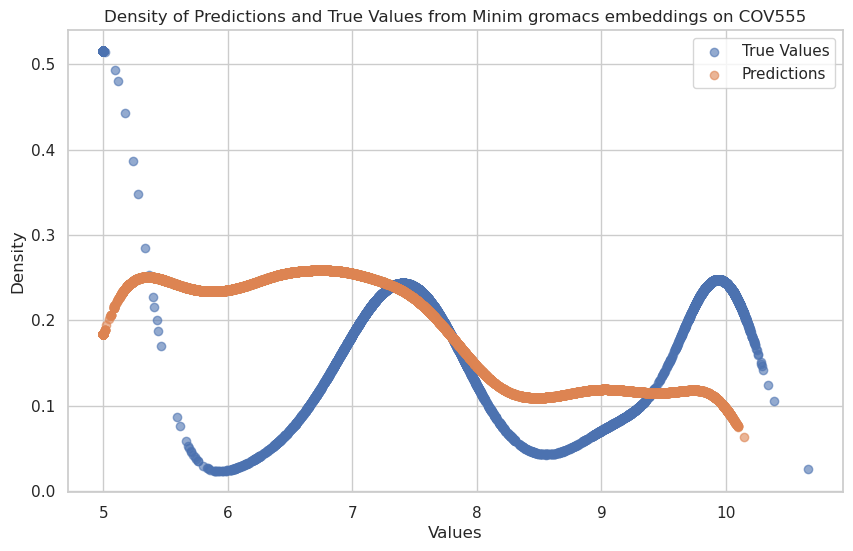

In [36]:
regression_plot(mutated_embeddings[-4], kd_cov555, RandomForestRegressor(n_estimators=10, n_jobs=-1), "Minim gromacs embeddings on COV555", on="all", train_size=5000, test_size=10000)

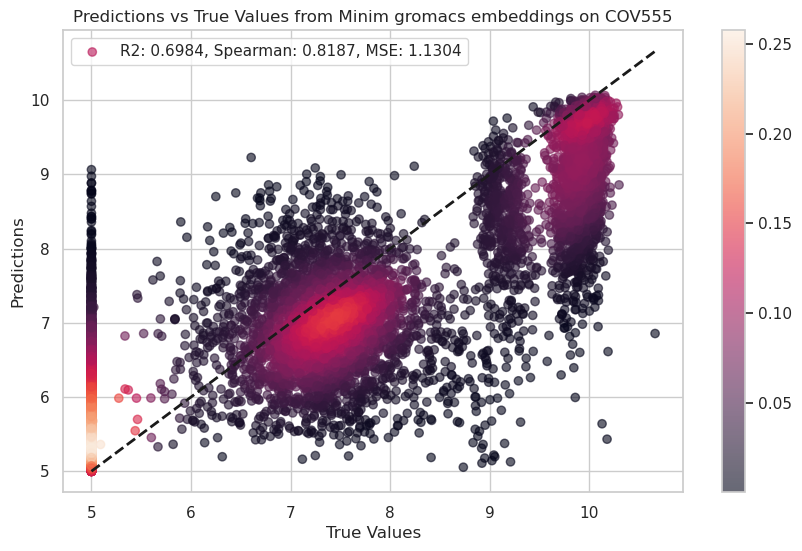

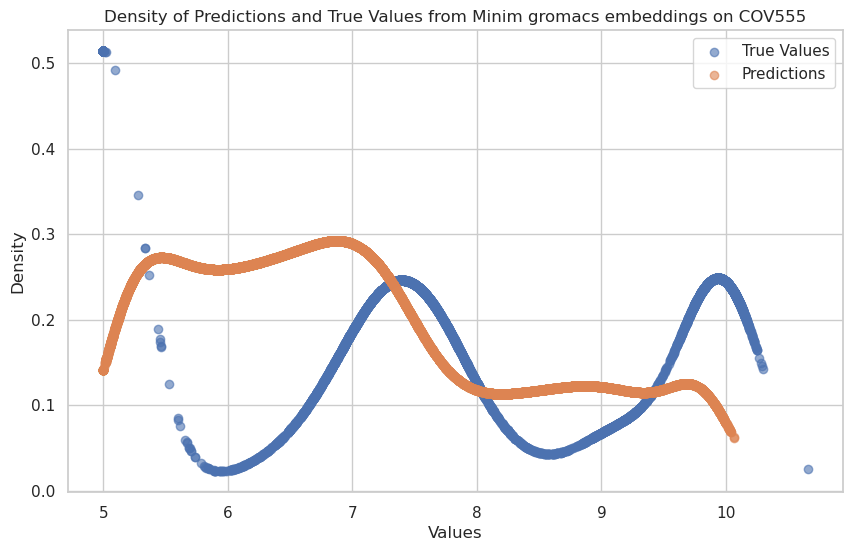

In [38]:
regression_plot(mutated_embeddings[-4], kd_cov555, RandomForestRegressor(n_estimators=100, n_jobs=-1), "Minim gromacs embeddings on COV555", on="all", train_size=5000, test_size=10000)

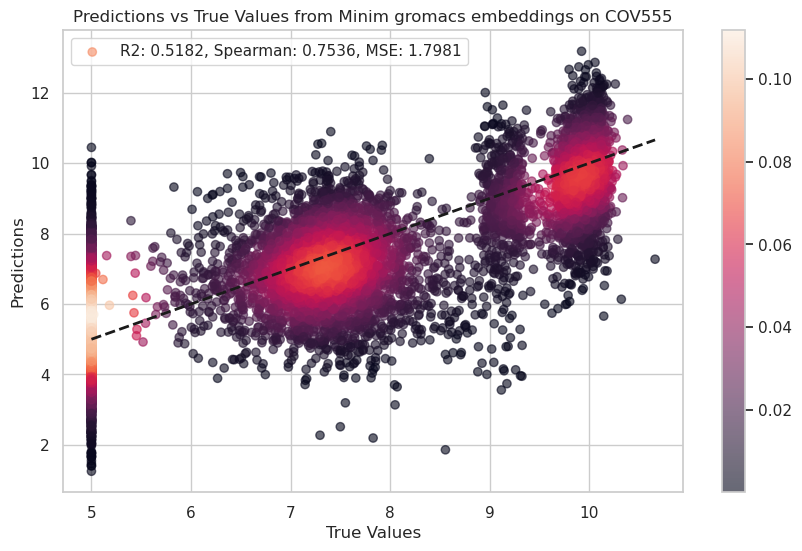

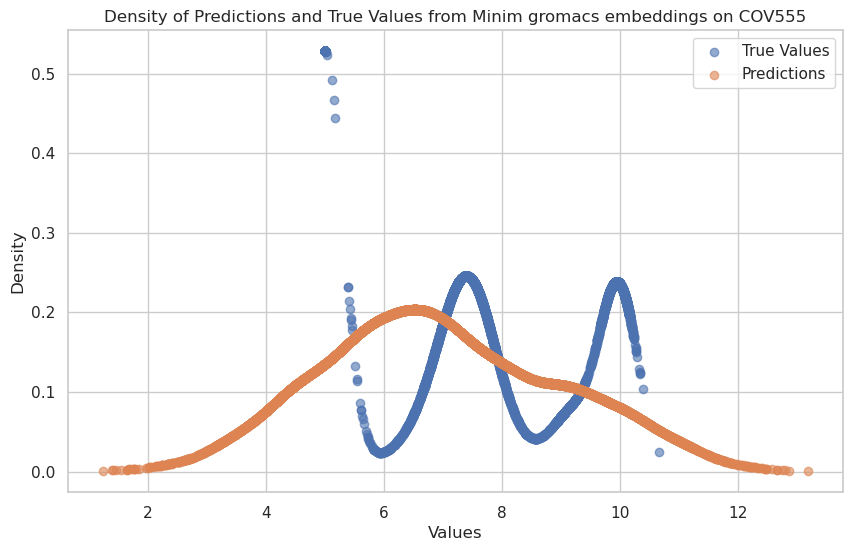

In [33]:
regression_plot(mutated_embeddings[-4], kd_cov555, LinearRegression(), "Minim gromacs embeddings on COV555", on="all", train_size=500, test_size=10000)

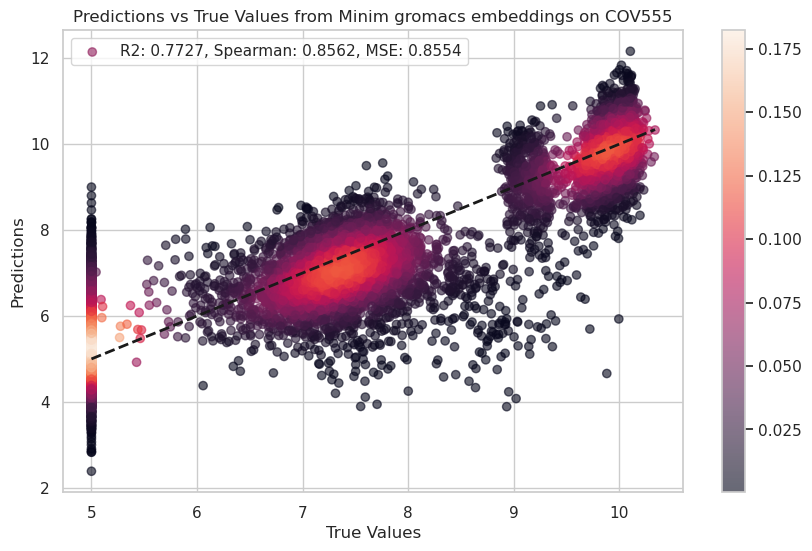

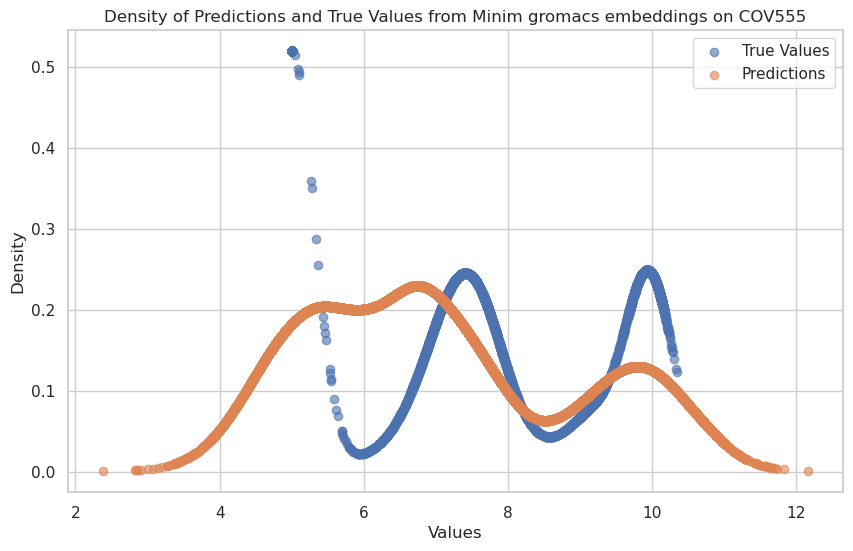

In [34]:
regression_plot(mutated_embeddings[-4], kd_cov555, LinearRegression(), "Minim gromacs embeddings on COV555", on="all", train_size=5000, test_size=10000)

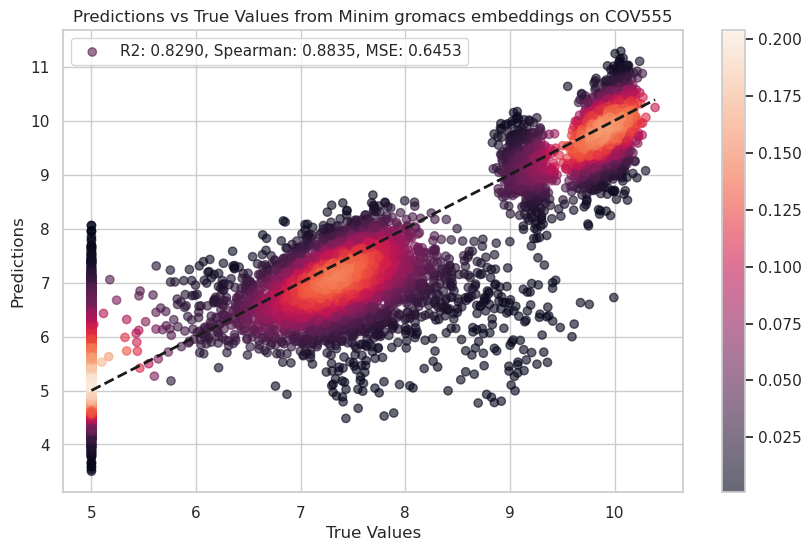

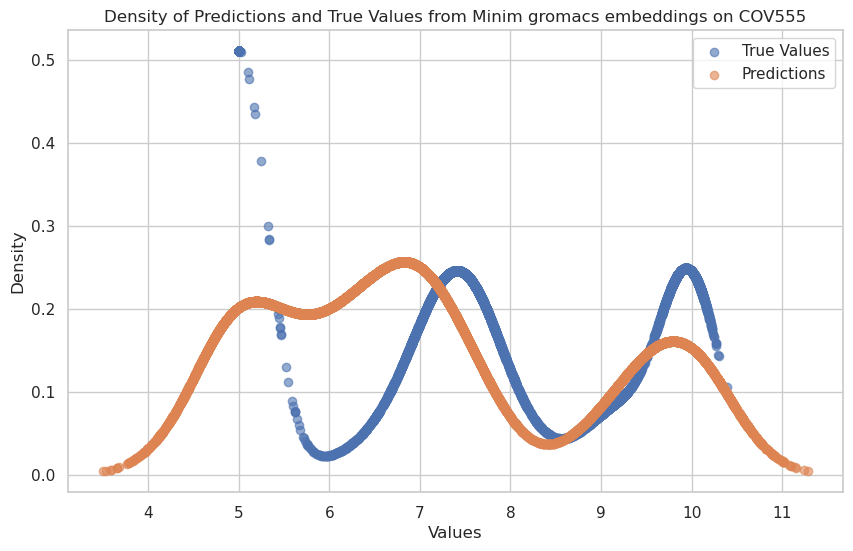

In [35]:
regression_plot(mutated_embeddings[-4], kd_cov555, LinearRegression(), "Minim gromacs embeddings on COV555", on="all", train_size=15000, test_size=10000)

(32768,)
(10000,)


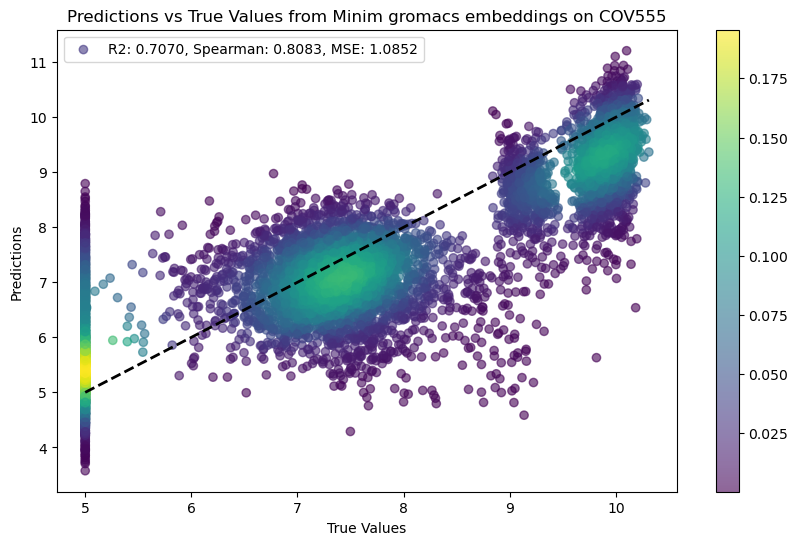

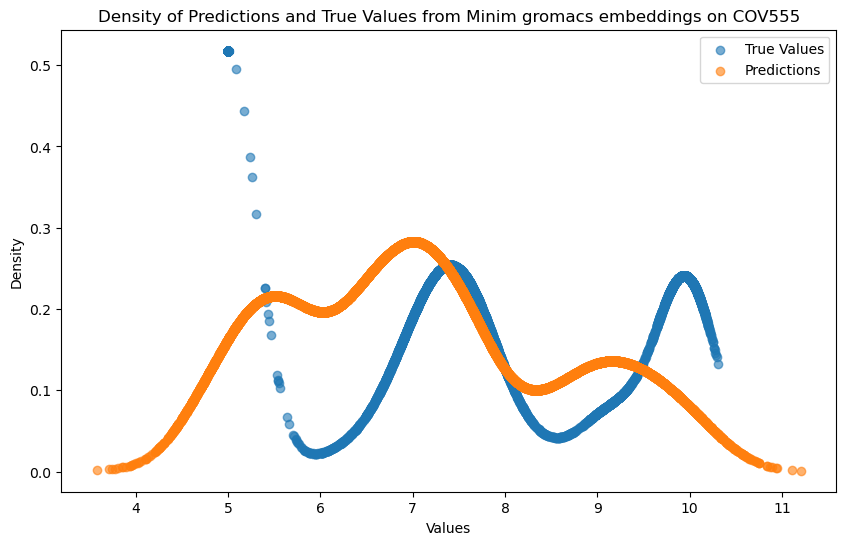

In [51]:
regression_plot(mutated_embeddings[-4], kd_cov555, SVR(), "Minim gromacs embeddings on COV555", on="all", train_size=500, test_size=10000, renormalize=True)

(32768,)
(10000,)


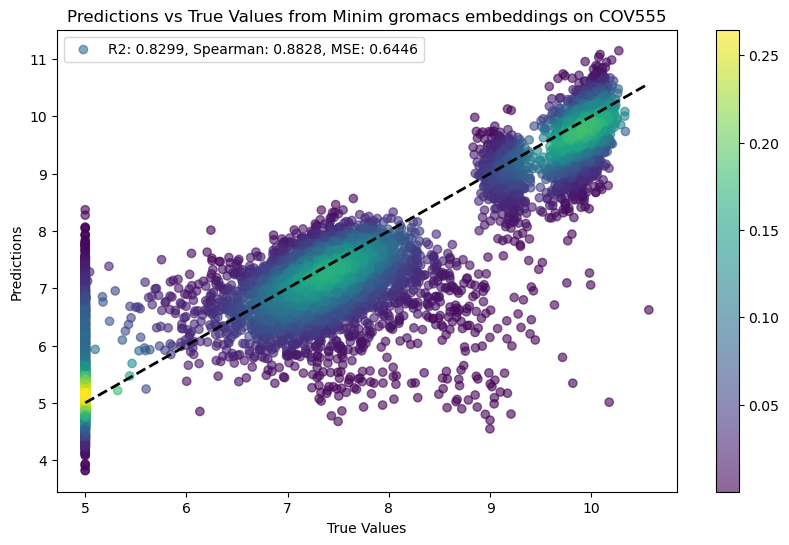

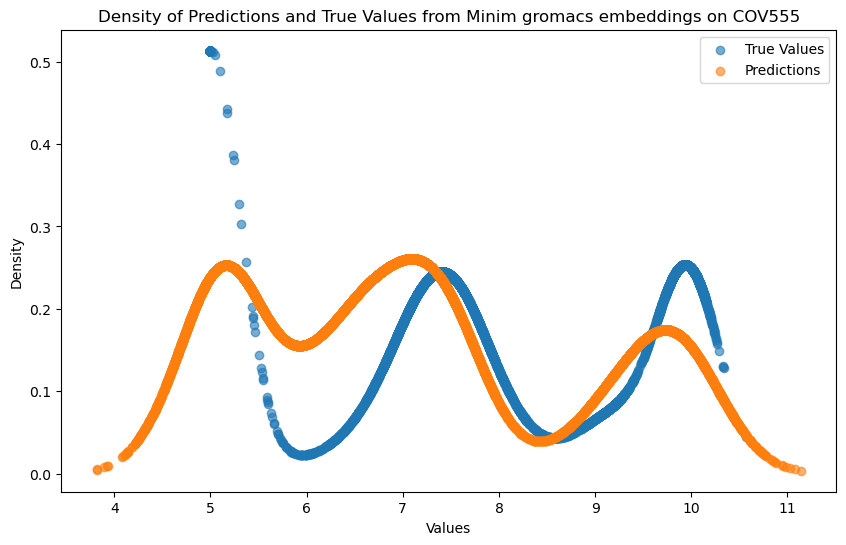

In [52]:
regression_plot(mutated_embeddings[-4], kd_cov555, SVR(), "Minim gromacs embeddings on COV555", on="all", train_size=5000, test_size=10000, renormalize=True)

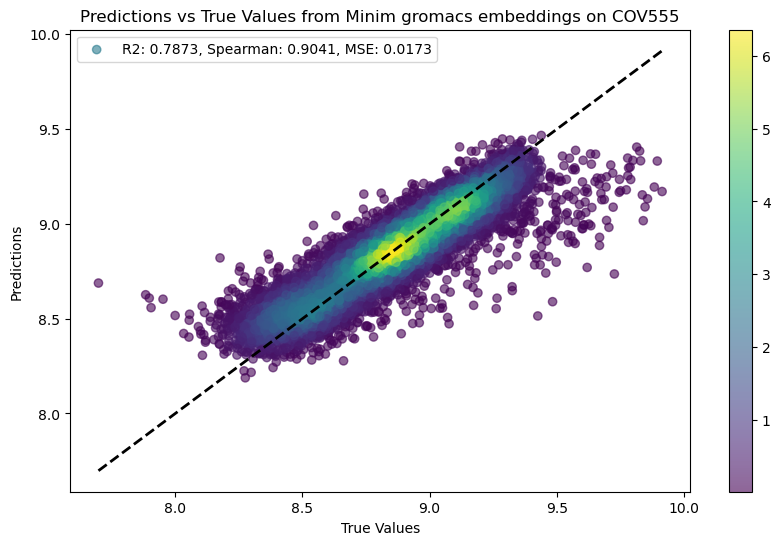

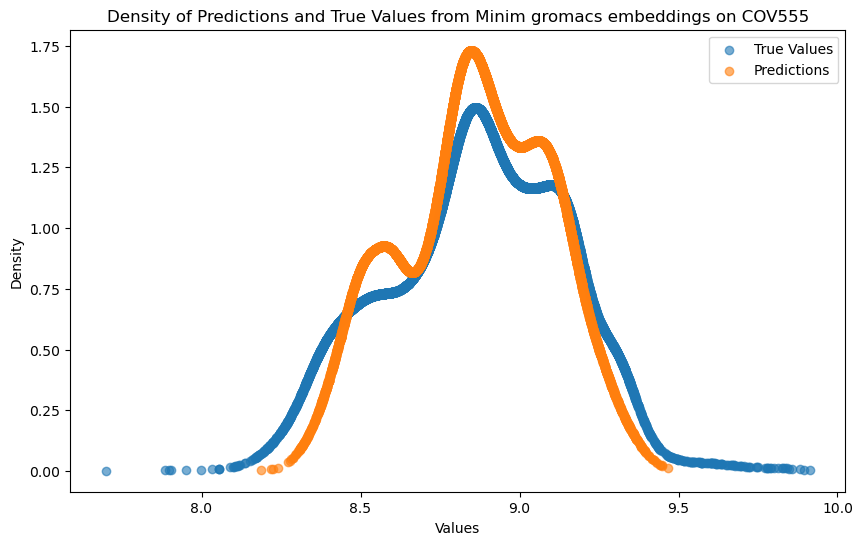

In [14]:
regression_plot(mutated_embeddings[-4], kd_s309, SVR(), "Minim gromacs embeddings on COV555", on="all", train_size=5000, test_size=10000, renormalize=True)

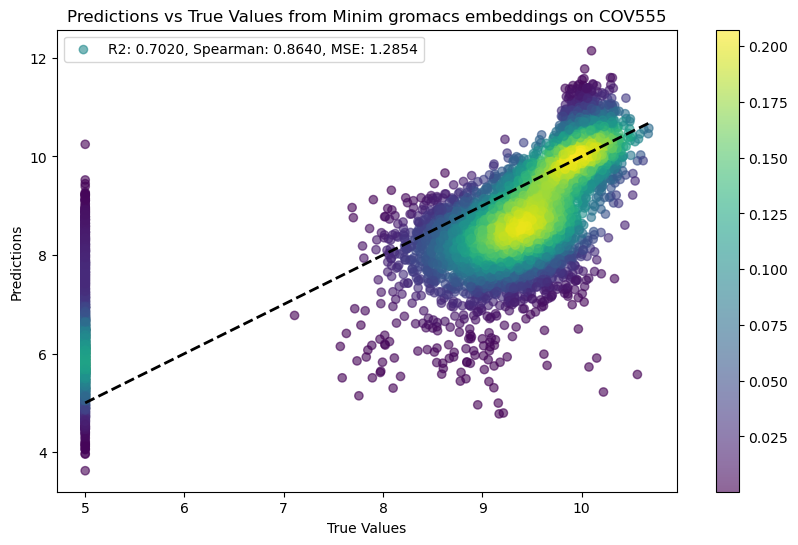

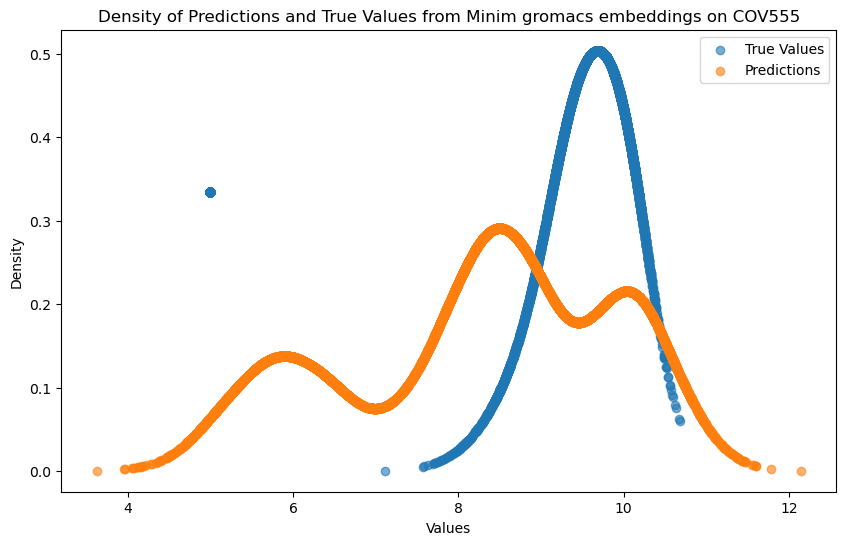

In [40]:
regression_plot(mutated_embeddings_normalize[2], kd_regn, SVR(), "Minim gromacs embeddings on COV555", on="all", train_size=500, test_size=10000, renormalize=True)

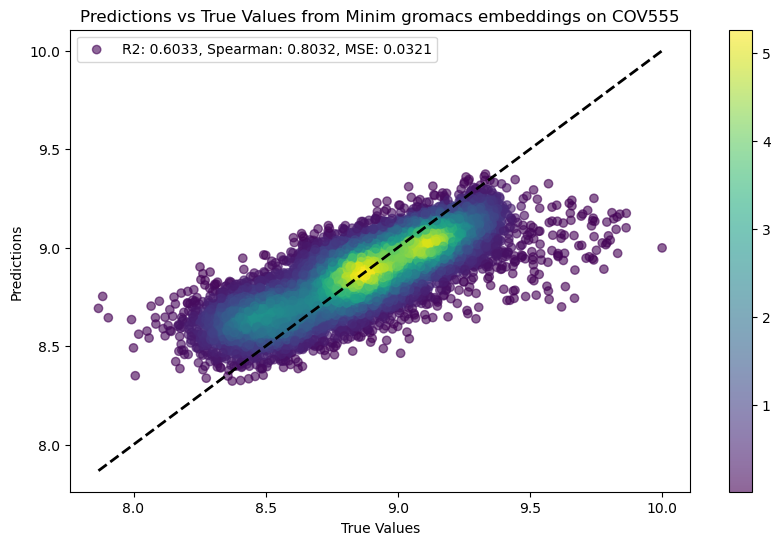

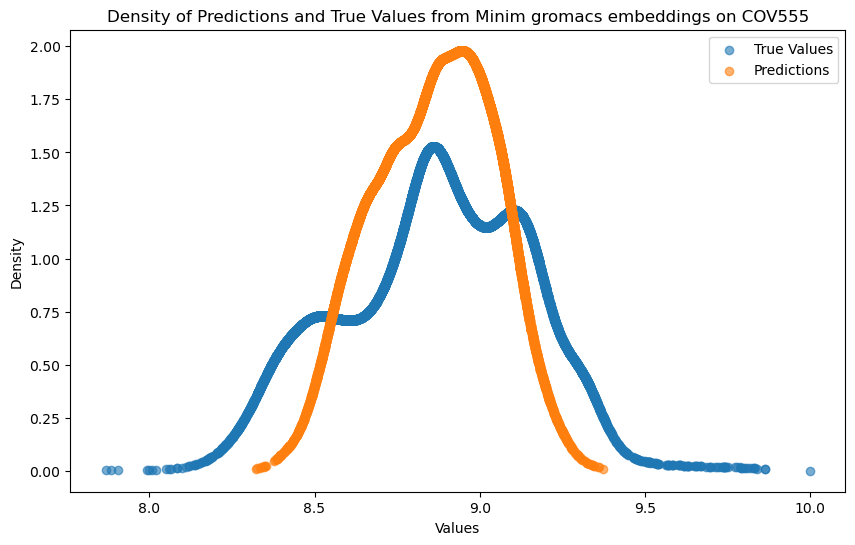

In [15]:
regression_plot(mutated_embeddings[-4], kd_s309, SVR(), "Minim gromacs embeddings on COV555", on="all", train_size=500, test_size=10000, renormalize=True)

# Accuracy binding/binding variant

In [109]:
def classification_plot(embeddings_X, kd_Y, model, train_size=0.2, test_size=0.2):
    # Split the data into training and test sets
    train_X, test_X, train_y, test_y = train_test_split(embeddings_X, kd_Y, test_size=test_size, train_size=train_size, random_state=42)

    # Train the model
    model.fit(train_X, train_y)

    # Make predictions on the test data
    predictions = model.predict(test_X)

    mask_binding = np.array((test_y > 5))
    test_y_binding = mask_binding.astype(int)
    
    # show AUC ROC
    fpr, tpr, thresholds = roc_curve(test_y_binding, predictions, drop_intermediate=True)

    # Compute accuracy, choose the best threshold
    accuracy = []
    for threshold in thresholds:
        accuracy.append(np.mean(np.logical_and(predictions > threshold, mask_binding)))
    best_threshold = thresholds[np.argmax(accuracy)]

    roc_auc = auc(fpr, tpr)
    plt.figure(figsize=(10, 6))
    plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'ROC Curve, Accuracy = {accuracy[np.argmax(accuracy)]:.2f}, Threshold = {best_threshold:.2f}')
    plt.legend()
    plt.show()



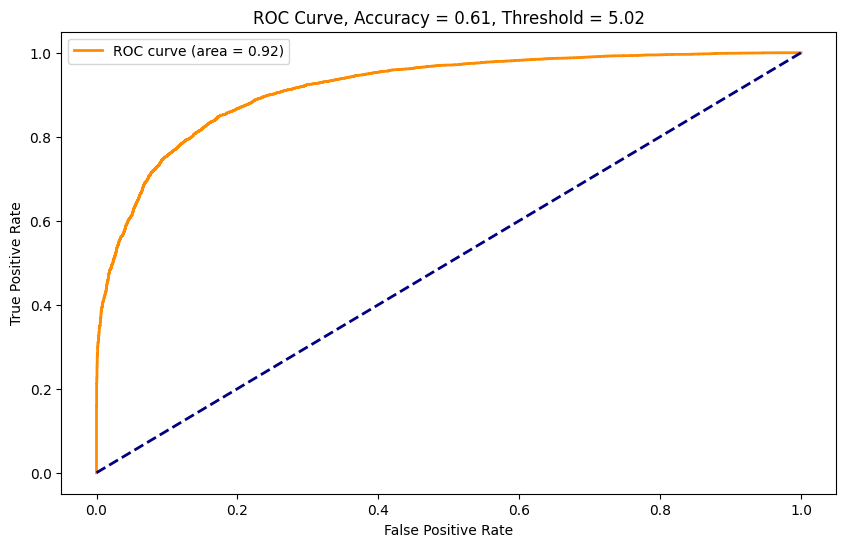

In [111]:
classification_plot(embeddings[0], kd_cov555, RandomForestRegressor(n_estimators=100, n_jobs=-1), train_size=1500, test_size=15000)

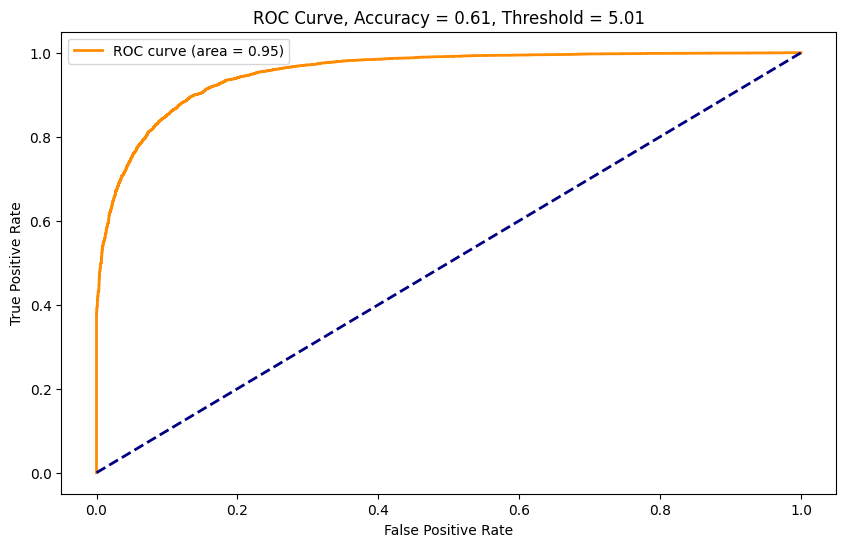

In [112]:
classification_plot(embeddings[1], kd_cov555, RandomForestRegressor(n_estimators=100, n_jobs=-1), train_size=1500, test_size=15000)

## Lets try to understand something with PCA

In [12]:
mutated_embeddings_names

['6xf5_mutated_1_evoef_final_relax.pt',
 '6xf5_mutated_1_evoef_first_relax.pt',
 '6xf5_noisy_same_struct.pt',
 'Isolated_WT_down_state_6xf5.pt',
 'final_relax_rbd_mutated_WT_6xf5.pt',
 'first_relax_rbd_mutated_WT_6xf5.pt',
 'noisy_WT_6xf5_different_struct.pt',
 'serial_final_relax_rbd_mutated_WT_6xf5.pt',
 'serial_first_relax_rbd_mutated_WT_6xf5.pt']

In [16]:
# import PCA
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

# PCA for embeddings and plot
pca = TSNE(n_components=2)
index = 2
pca.fit(mutated_embeddings[index][:1000])
print("fit done")

pca_different_structures = pca.transform(mutated_embeddings[3])
pca_same_structure = pca.transform(mutated_embeddings[2])
pca_same_structure_1 = pca.transform(mutated_embeddings[1])


plt.figure(figsize=(10, 6))
plt.scatter(pca_different_structures[:, 0], pca_different_structures[:, 1], alpha=0.1, label="Different structures")
plt.scatter(pca_same_structure[:, 0], pca_same_structure[:, 1], alpha=0.1, label="Same structure")
plt.scatter(pca_same_structure_1[:, 0], pca_same_structure_1[:, 1], alpha=0.1, label="Same structure 1")
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title('PCA of embeddings')
plt.legend()
plt.show()